In [68]:

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
import sklearn as sk





# Understanding of both train and test

In [69]:

train= pd.read_csv('D:/Data Science/01 Welcome to the course/train.csv')
test= pd.read_csv('D:/Data Science/01 Welcome to the course/test.csv')


In [70]:
train.describe()


,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color
count,26729,19038,26729,26729,13117,26729,26728,26711,26729,26729
unique,26729,6374,22918,5,16,2,5,44,1380,366
top,A717711,Max,2015-08-11 00:00:00,Adoption,Partner,Dog,Neutered Male,1 year,Domestic Shorthair Mix,Black/White
freq,1,136,19,10769,7816,15595,9779,3969,8810,2824


In [71]:
test.describe(include='object')
test.head(100)

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color
0,1,Summer,2015-10-12 12:15:00,Dog,Intact Female,10 months,Labrador Retriever Mix,Red/White
1,2,Cheyenne,2014-07-26 17:59:00,Dog,Spayed Female,2 years,German Shepherd/Siberian Husky,Black/Tan
2,3,Gus,2016-01-13 12:20:00,Cat,Neutered Male,1 year,Domestic Shorthair Mix,Brown Tabby
3,4,Pongo,2013-12-28 18:12:00,Dog,Intact Male,4 months,Collie Smooth Mix,Tricolor
4,5,Skooter,2015-09-24 17:59:00,Dog,Neutered Male,2 years,Miniature Poodle Mix,White
5,6,Beau,2015-06-23 11:17:00,Dog,Neutered Male,3 years,Beagle Mix,Brown/White
6,7,Bobo,2014-03-12 09:45:00,Cat,Neutered Male,13 years,Domestic Medium Hair Mix,Brown Tabby/White
7,8,Abby,2014-06-25 08:27:00,Cat,Spayed Female,6 months,Domestic Shorthair Mix,Brown Tabby
8,9,Ruby Grace,2014-11-12 18:05:00,Dog,Spayed Female,3 months,Cairn Terrier,Black/Cream
9,10,Ruby,2014-04-07 17:41:00,Dog,Spayed Female,1 year,Pit Bull Mix,Brown/White


In [72]:
train.groupby(['SexuponOutcome','OutcomeType'])['AnimalID'].count()

SexuponOutcome  OutcomeType    
Intact Female   Adoption            203
                Died                 56
                Euthanasia          401
                Return_to_owner     301
                Transfer           2550
Intact Male     Adoption            158
                Died                 79
                Euthanasia          477
                Return_to_owner     477
                Transfer           2334
Neutered Male   Adoption           5222
                Died                 19
                Euthanasia          344
                Return_to_owner    2247
                Transfer           1947
Spayed Female   Adoption           5186
                Died                 18
                Euthanasia          232
                Return_to_owner    1748
                Transfer           1636
Unknown         Died                 25
                Euthanasia          101
                Return_to_owner      12
                Transfer            955
Name: An

In [73]:
train.isnull().sum()

AnimalID              0
Name               7691
DateTime              0
OutcomeType           0
OutcomeSubtype    13612
AnimalType            0
SexuponOutcome        1
AgeuponOutcome       18
Breed                 0
Color                 0
dtype: int64

In [74]:
train.nunique()

AnimalID          26729
Name               6374
DateTime          22918
OutcomeType           5
OutcomeSubtype       16
AnimalType            2
SexuponOutcome        5
AgeuponOutcome       44
Breed              1380
Color               366
dtype: int64

In [75]:
train['SexuponOutcome'].unique()
train['SexuponOutcome']=np.where(train['SexuponOutcome'].isnull(),'Neutered Male',train['SexuponOutcome'])
train['AgeuponOutcome']=np.where(train['AgeuponOutcome'].isnull(),'1 year',train['AgeuponOutcome'])

In [76]:
train.isnull().sum()

AnimalID              0
Name               7691
DateTime              0
OutcomeType           0
OutcomeSubtype    13612
AnimalType            0
SexuponOutcome        0
AgeuponOutcome        0
Breed                 0
Color                 0
dtype: int64

In [77]:
test.isnull().sum()

ID                   0
Name              3225
DateTime             0
AnimalType           0
SexuponOutcome       0
AgeuponOutcome       6
Breed                0
Color                0
dtype: int64

In [78]:
test.describe(include='object')

,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color
count,8231,11456,11456,11456,11450,11456,11456
unique,3712,10575,2,5,45,913,277
top,Bella,2015-07-02 00:00:00,Dog,Neutered Male,1 year,Domestic Shorthair Mix,Black/White
freq,60,8,6656,4235,1768,3777,1219


In [79]:
test['AgeuponOutcome']=np.where(test['AgeuponOutcome'].isnull(),'1 year',test['AgeuponOutcome'])
test.isnull().sum()

ID                   0
Name              3225
DateTime             0
AnimalType           0
SexuponOutcome       0
AgeuponOutcome       0
Breed                0
Color                0
dtype: int64

# datetime eda

In [80]:
train['DateTime'].describe()
min(train['DateTime'])

'2013-10-01 09:31:00'

In [81]:
max(train['DateTime'])

'2016-02-21 19:17:00'

In [82]:
min(test['DateTime'])

'2013-10-01 10:44:00'

In [83]:
max(test['DateTime'])

'2016-02-21 18:37:00'

In [84]:
train['DateTime'].describe()

count                   26729
unique                  22918
top       2015-08-11 00:00:00
freq                       19
Name: DateTime, dtype: object

In [85]:
test['DateTime'].describe()

count                   11456
unique                  10575
top       2015-07-02 00:00:00
freq                        8
Name: DateTime, dtype: object

In [86]:
train['DateTime']=pd.to_datetime(train['DateTime'], format="%Y-%m-%d %H:%M")
train.dtypes

AnimalID                  object
Name                      object
DateTime          datetime64[ns]
OutcomeType               object
OutcomeSubtype            object
AnimalType                object
SexuponOutcome            object
AgeuponOutcome            object
Breed                     object
Color                     object
dtype: object

In [87]:
train['year']= train['DateTime'].dt.year
train['month']=train['DateTime'].dt.month
train['day']=train['DateTime'].dt.day
train['houroftheday']=train['DateTime'].dt.hour
train['minutes']=train['DateTime'].dt.minute

In [88]:
train.dtypes

AnimalID                  object
Name                      object
DateTime          datetime64[ns]
OutcomeType               object
OutcomeSubtype            object
AnimalType                object
SexuponOutcome            object
AgeuponOutcome            object
Breed                     object
Color                     object
year                       int64
month                      int64
day                        int64
houroftheday               int64
minutes                    int64
dtype: object

In [89]:
test.dtypes

ID                 int64
Name              object
DateTime          object
AnimalType        object
SexuponOutcome    object
AgeuponOutcome    object
Breed             object
Color             object
dtype: object

In [90]:
test['DateTime']=pd.to_datetime(test['DateTime'], format='%Y-%m-%d %H:%M')
test['year']=test['DateTime'].dt.year
test['month']=test['DateTime'].dt.month
test['day']=test['DateTime'].dt.day
test['houroftheday']=test['DateTime'].dt.hour
test['minutes']=test['DateTime'].dt.minute
test.dtypes






ID                         int64
Name                      object
DateTime          datetime64[ns]
AnimalType                object
SexuponOutcome            object
AgeuponOutcome            object
Breed                     object
Color                     object
year                       int64
month                      int64
day                        int64
houroftheday               int64
minutes                    int64
dtype: object

In [91]:
year_data=((train.groupby(['year','OutcomeType'])['AnimalID'].count())/(train.groupby('year')['AnimalID'].count()))*100
year_data.head(30)

year  OutcomeType    
2013  Adoption           41.746854
      Died                0.592154
      Euthanasia          6.772761
      Return_to_owner    16.062176
      Transfer           34.826055
2014  Adoption           38.983809
      Died                0.617229
      Euthanasia          6.476429
      Return_to_owner    16.817247
      Transfer           37.105287
2015  Adoption           40.240397
      Died                0.905844
      Euthanasia          5.313126
      Return_to_owner    18.874662
      Transfer           34.665970
2016  Adoption           48.500366
      Died                0.585223
      Euthanasia          2.779810
      Return_to_owner    22.311631
      Transfer           25.822970
Name: AnimalID, dtype: float64

In [92]:
month_data=train.groupby(['month','OutcomeType'])['AnimalID'].count()/train.groupby('month')['AnimalID'].count()
month_data=pd.DataFrame(month_data)
month_data=month_data.reset_index()
month_data.head(30)

,month,OutcomeType,AnimalID
0,1,Adoption,0.447729
1,1,Died,0.005141
2,1,Euthanasia,0.050129
3,1,Return_to_owner,0.217224
4,1,Transfer,0.279777
5,2,Adoption,0.437266
6,2,Died,0.005339
7,2,Euthanasia,0.058195
8,2,Return_to_owner,0.219968
9,2,Transfer,0.279231


C:\Users\Transorg\Anaconda3\lib\site-packages\seaborn\categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


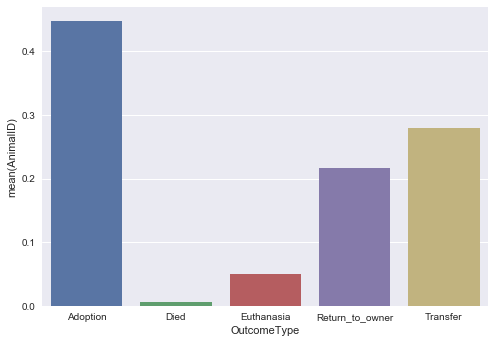

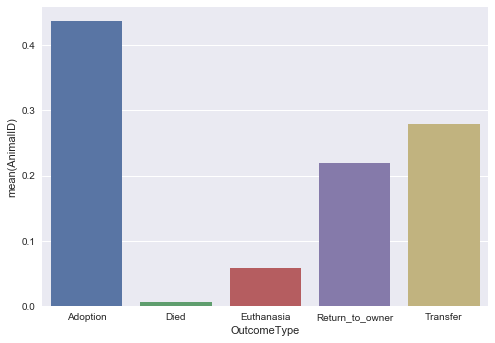

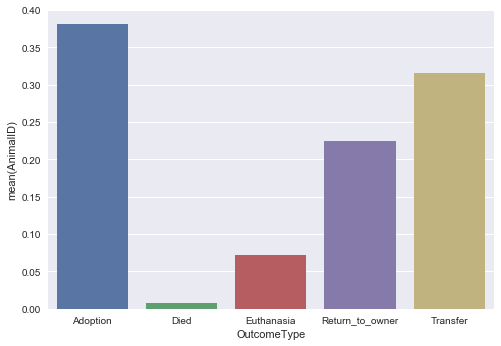

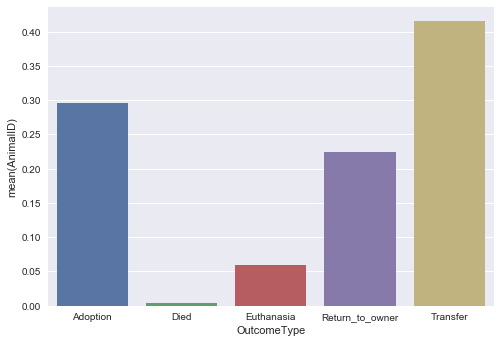

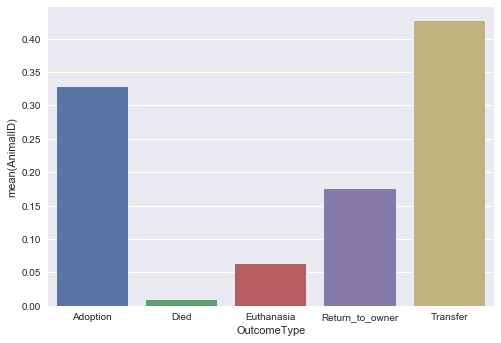

...

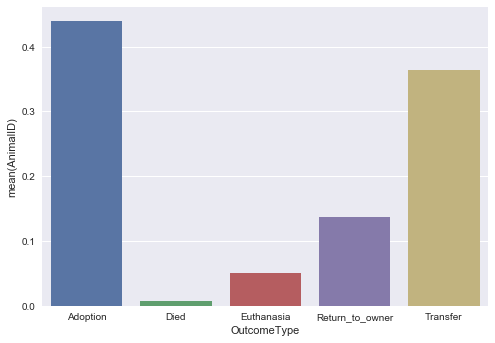

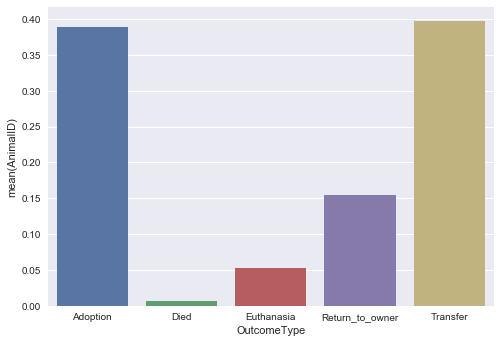

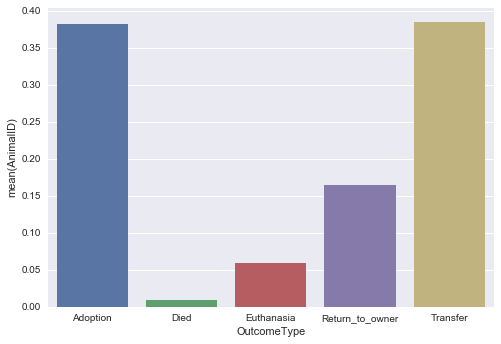

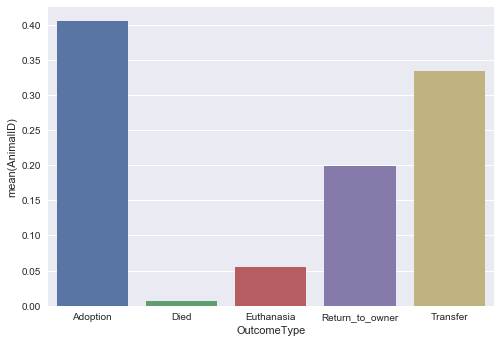

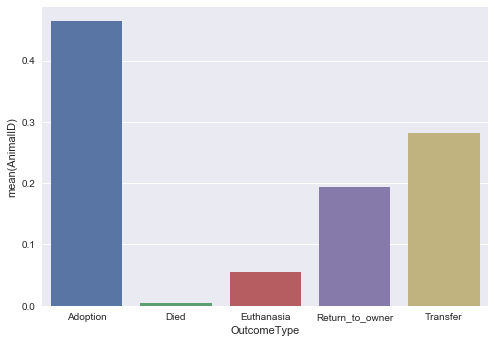

In [93]:
monthyear= range(1,13,1)
for i in monthyear:
    df_new1=month_data[month_data['month']==i]
    plt.figure()
    sn.barplot(df_new1['OutcomeType'],df_new1['AnimalID'])
    plt.show()


In [94]:
month_data.columns

Index(['month', 'OutcomeType', 'AnimalID'], dtype='object')

In [95]:
(train.groupby(['OutcomeType'])['AnimalID'].count()/train['OutcomeType'].count())*100

OutcomeType
Adoption           40.289573
Died                0.737027
Euthanasia          5.817651
Return_to_owner    17.905646
Transfer           35.250103
Name: AnimalID, dtype: float64

# Animal Type

In [96]:
(train.groupby(['AnimalType','OutcomeType'])['AnimalID'].count()/train.groupby('AnimalType')['AnimalID'].count())*100

AnimalType  OutcomeType    
Cat         Adoption           38.368960
            Died                1.320280
            Euthanasia          6.376864
            Return_to_owner     4.490749
            Transfer           49.443147
Dog         Adoption           41.660789
            Died                0.320616
            Euthanasia          5.418403
            Return_to_owner    27.483168
            Transfer           25.117025
Name: AnimalID, dtype: float64

In [97]:
train.loc[train['AnimalType']=='Dog','AnimalType']=1
train.loc[train['AnimalType']=='Cat','AnimalType']=0


In [98]:
test.loc[test['AnimalType']=='Dog','AnimalType']=1
test.loc[test['AnimalType']=='Cat','AnimalType']=0

In [99]:
test.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes
0,1,Summer,2015-10-12 12:15:00,1,Intact Female,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15
1,2,Cheyenne,2014-07-26 17:59:00,1,Spayed Female,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59
2,3,Gus,2016-01-13 12:20:00,0,Neutered Male,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20
3,4,Pongo,2013-12-28 18:12:00,1,Intact Male,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12
4,5,Skooter,2015-09-24 17:59:00,1,Neutered Male,2 years,Miniature Poodle Mix,White,2015,9,24,17,59


In [100]:
train.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,Neutered Male,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,Spayed Female,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,Neutered Male,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,Neutered Male,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52


In [101]:
(train.groupby(['AnimalType','SexuponOutcome'])['AnimalID'].count()/train.groupby('AnimalType')['AnimalID'].count())*100

AnimalType  SexuponOutcome
0           Intact Female     18.986887
            Intact Male       17.307347
            Neutered Male     27.528292
            Spayed Female     27.052272
            Unknown            9.125202
1           Intact Female      8.957999
            Intact Male       10.246874
            Neutered Male     43.058673
            Spayed Female     37.242706
            Unknown            0.493748
Name: AnimalID, dtype: float64

In [102]:
train.groupby(['AnimalType','SexuponOutcome','OutcomeType'])['AnimalID'].count()

AnimalType  SexuponOutcome  OutcomeType    
0           Intact Female   Adoption            141
                            Died                 40
                            Euthanasia          206
                            Return_to_owner      18
                            Transfer           1709
            Intact Male     Adoption             97
                            Died                 64
                            Euthanasia          231
                            Return_to_owner      10
                            Transfer           1525
            Neutered Male   Adoption           2001
                            Died                  9
                            Euthanasia          108
                            Return_to_owner     252
                            Transfer            695
            Spayed Female   Adoption           2033
                            Died                 11
                            Euthanasia           75
                    

In [103]:
test['SexuponOutcome'].unique()

array(['Intact Female', 'Spayed Female', 'Neutered Male', 'Intact Male',
       'Unknown'], dtype=object)

In [104]:
test.groupby('SexuponOutcome')['ID'].count()

SexuponOutcome
Intact Female    1493
Intact Male      1460
Neutered Male    4235
Spayed Female    3813
Unknown           455
Name: ID, dtype: int64

# SexuponOutcome

In [105]:
train.groupby('SexuponOutcome')['AnimalID'].count()

SexuponOutcome
Intact Female    3511
Intact Male      3525
Neutered Male    9780
Spayed Female    8820
Unknown          1093
Name: AnimalID, dtype: int64

In [106]:
train['Sex']=np.nan
train['Sex']=np.where(train['SexuponOutcome'].str.contains('Male'),1,train['Sex'])
train['Sex']=np.where(train['SexuponOutcome'].str.contains('Female'),2,train['Sex'])
train['Sex']=np.where(train['SexuponOutcome'].str.contains('Unknown'),3,train['Sex'])
train.head(20)

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,Neutered Male,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,Spayed Female,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,Neutered Male,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,Neutered Male,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,Intact Female,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,Unknown,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,Spayed Female,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,Spayed Female,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0


In [107]:
train.groupby(['Sex','OutcomeType'])['AnimalID'].count()

Sex  OutcomeType    
1.0  Adoption           5380
     Died                 98
     Euthanasia          821
     Return_to_owner    2725
     Transfer           4281
2.0  Adoption           5389
     Died                 74
     Euthanasia          633
     Return_to_owner    2049
     Transfer           4186
3.0  Died                 25
     Euthanasia          101
     Return_to_owner      12
     Transfer            955
Name: AnimalID, dtype: int64

In [108]:
test['Sex']=np.nan
test['Sex']=np.where(test['SexuponOutcome'].str.contains('Male'),1,test['Sex'])
test['Sex']=np.where(test['SexuponOutcome'].str.contains('Female'),2,test['Sex'])
test['Sex']=np.where(test['SexuponOutcome'].str.contains('Unknown'),3,test['Sex'])
test.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex
0,1,Summer,2015-10-12 12:15:00,1,Intact Female,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0
1,2,Cheyenne,2014-07-26 17:59:00,1,Spayed Female,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0
2,3,Gus,2016-01-13 12:20:00,0,Neutered Male,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0
3,4,Pongo,2013-12-28 18:12:00,1,Intact Male,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0
4,5,Skooter,2015-09-24 17:59:00,1,Neutered Male,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0


In [109]:
train['neutered']=np.nan
train['neutered']=np.where(train['SexuponOutcome'].str.contains('Neutered|Spayed'),1,0)
train.head(20)

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,Neutered Male,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,Spayed Female,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,Neutered Male,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,Neutered Male,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,Intact Female,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0,0
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,Intact Male,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0,0
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,Unknown,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0,0
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,Spayed Female,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0,1
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,Spayed Female,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0,1


In [110]:
test['neutered']=np.nan
test['neutered']=np.where(test['SexuponOutcome'].str.contains('Neutered|Spayed'),1,0)
test.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered
0,1,Summer,2015-10-12 12:15:00,1,Intact Female,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0
1,2,Cheyenne,2014-07-26 17:59:00,1,Spayed Female,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1
2,3,Gus,2016-01-13 12:20:00,0,Neutered Male,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1
3,4,Pongo,2013-12-28 18:12:00,1,Intact Male,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0
4,5,Skooter,2015-09-24 17:59:00,1,Neutered Male,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1


In [111]:
train1=train.copy()
test1=test.copy()

In [112]:
train.loc[train['SexuponOutcome']=='Intact Female', 'SexuponOutcome']=1
train.loc[train['SexuponOutcome']=='Spayed Female', 'SexuponOutcome']=2
train.loc[train['SexuponOutcome']=='Neutered Male', 'SexuponOutcome']=3
train.loc[train['SexuponOutcome']=='Intact Male', 'SexuponOutcome']=4
train.loc[train['SexuponOutcome']=='Unknown', 'SexuponOutcome']=5
train.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1


In [113]:
train.head(20)

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,1,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0,0
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0,0
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,5,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0,0
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,2,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0,1
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,2,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0,1


In [114]:
test.loc[test['SexuponOutcome']=='Intact Female', 'SexuponOutcome']=1
test.loc[test['SexuponOutcome']=='Spayed Female', 'SexuponOutcome']=2
test.loc[test['SexuponOutcome']=='Neutered Male', 'SexuponOutcome']=3
test.loc[test['SexuponOutcome']=='Intact Male', 'SexuponOutcome']=4
test.loc[test['SexuponOutcome']=='Unknown', 'SexuponOutcome']=5
test.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1


In [115]:
train1=train.copy()
test1=test.copy()

In [116]:
df_temp_train=train1.loc[:,'AgeuponOutcome'].str.split(" ", expand=True)
df_temp_train.head()

,0,1
0,1,year
1,1,year
2,2,years
3,3,weeks
4,2,years


In [117]:
df_temp_train.columns=['Age', 'Time']
df_temp_train.head()

,Age,Time
0,1,year
1,1,year
2,2,years
3,3,weeks
4,2,years


In [118]:
train1['Age']=df_temp_train['Age']
train1['Time']=df_temp_train['Time']
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,1,year
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,1,year
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,2,years
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,3,weeks
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,2,years


In [119]:
train1.isnull().sum()


AnimalID              0
Name               7691
DateTime              0
OutcomeType           0
OutcomeSubtype    13612
AnimalType            0
SexuponOutcome        0
AgeuponOutcome        0
Breed                 0
Color                 0
year                  0
month                 0
day                   0
houroftheday          0
minutes               0
Sex                   0
neutered              0
Age                   0
Time                  0
dtype: int64

In [120]:
train1['Time'].unique()


array(['year', 'years', 'weeks', 'month', 'months', 'days', 'week', 'day'],
      dtype=object)

In [121]:
train1.dtypes

AnimalID                  object
Name                      object
DateTime          datetime64[ns]
OutcomeType               object
OutcomeSubtype            object
AnimalType                 int64
SexuponOutcome             int64
AgeuponOutcome            object
Breed                     object
Color                     object
year                       int64
month                      int64
day                        int64
houroftheday               int64
minutes                    int64
Sex                      float64
neutered                   int32
Age                       object
Time                      object
dtype: object

In [122]:
train1['Age']=train1['Age'].astype('int64')
train1['Age']= np.where(train1.Time.str.startswith('year'),train1['Age']*365,train1['Age'])
train1['Age']= np.where(train1.Time.str.startswith('month'),train1['Age']*30,train1['Age'])
train1['Age']= np.where(train1.Time.str.startswith('week'),train1['Age']*7,train1['Age'])
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years


In [123]:
train1.groupby('SexuponOutcome')['Age'].mean()

SexuponOutcome
1    544.718599
2    916.865079
3    933.868507
4    524.230638
5    217.925892
Name: Age, dtype: float64

In [124]:
pd.options.display.max_rows=300
pd.options.display.max_columns=100


In [125]:
age_outcome=pd.DataFrame(train1.groupby(['OutcomeType','Age'], as_index=False)['AnimalID'].count())
age_outcome


,OutcomeType,Age,AnimalID
0,Adoption,30,444
1,Adoption,60,2636
2,Adoption,90,811
3,Adoption,120,453
4,Adoption,150,349
5,Adoption,180,291
6,Adoption,210,139
7,Adoption,240,205
8,Adoption,270,94
9,Adoption,300,238


In [126]:
train1['Age'].unique()

array([ 365,  730,   21,   30,  150, 1460,   90,   14,   60,  300,  180,
       1825, 2555, 1095,  120, 4380, 3285, 2190,    7, 4015,   28,  210,
       2920,  330,    4,  270,  240, 5475, 3650,    0, 5110,    3,    6,
          5,   35,    2, 5840,    1, 4745, 6205, 6570, 6935, 7300],
      dtype=int64)

In [127]:
train1.groupby('OutcomeType')['Age'].median()

OutcomeType
Adoption            270
Died                 30
Euthanasia          730
Return_to_owner    1095
Transfer            225
Name: Age, dtype: int64

In [128]:
train1.groupby('OutcomeType')['Age'].mean()

OutcomeType
Adoption            599.302628
Died                495.720812
Euthanasia         1447.473955
Return_to_owner    1506.801713
Transfer            552.395988
Name: Age, dtype: float64

In [129]:
train1[train1['Age']==0].count()

AnimalID          22
Name               0
DateTime          22
OutcomeType       22
OutcomeSubtype    22
AnimalType        22
SexuponOutcome    22
AgeuponOutcome    22
Breed             22
Color             22
year              22
month             22
day               22
houroftheday      22
minutes           22
Sex               22
neutered          22
Age               22
Time              22
dtype: int64

In [130]:
df_temp_test=test.loc[:,'AgeuponOutcome'].str.split(" ", expand=True)
df_temp_test.columns=['Age', 'Time']
test1['Age']=df_temp_test['Age']
test1['Time']=df_temp_test['Time']
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,10,months
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,2,years
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,1,year
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,4,months
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,2,years


In [131]:
test1['Age']=test1['Age'].astype('int64')
test1['Age']= np.where(test1.Time.str.startswith('year'),test1['Age']*365,test1['Age'])
test1['Age']= np.where(test1.Time.str.startswith('month'),test1['Age']*30,test1['Age'])
test1['Age']= np.where(test1.Time.str.startswith('week'),test1['Age']*7,test1['Age'])
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years


In [132]:
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years


In [133]:
train1.loc[train1['Name'].isnull(), 'name_present']= 0
train1.loc[train1['Name'].notnull(), 'name_present']= 1
train1.head()


,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0


In [134]:
train1.groupby(['OutcomeType','name_present'])['AnimalID'].count()

OutcomeType      name_present
Adoption         0.0             1678
                 1.0             9091
Died             0.0              120
                 1.0               77
Euthanasia       0.0              815
                 1.0              740
Return_to_owner  0.0              153
                 1.0             4633
Transfer         0.0             4925
                 1.0             4497
Name: AnimalID, dtype: int64

In [135]:
train1.isnull().sum()

AnimalID              0
Name               7691
DateTime              0
OutcomeType           0
OutcomeSubtype    13612
AnimalType            0
SexuponOutcome        0
AgeuponOutcome        0
Breed                 0
Color                 0
year                  0
month                 0
day                   0
houroftheday          0
minutes               0
Sex                   0
neutered              0
Age                   0
Time                  0
name_present          0
dtype: int64

In [136]:
test1.loc[test1['Name'].isnull(), 'name_present']= 0
test1.loc[test1['Name'].notnull(), 'name_present']= 1
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0


In [137]:
train1['lengthofname']= train1['Name'].str.len()
train1['lengthofname'].replace(to_replace=np.nan, value=0, inplace=True)
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0


In [138]:
train1.groupby(['OutcomeType','lengthofname'])['AnimalID'].count()

OutcomeType      lengthofname
Adoption         0.0             1678
                 1.0                5
                 2.0               36
                 3.0              433
                 4.0             1757
                 5.0             2672
                 6.0             2083
                 7.0             1040
                 8.0              501
                 9.0              248
                 10.0             149
                 11.0              96
                 12.0              71
Died             0.0              120
                 3.0                6
                 4.0               14
                 5.0               22
                 6.0               20
                 7.0                7
                 8.0                5
                 9.0                2
                 11.0               1
Euthanasia       0.0              815
                 1.0                1
                 2.0                4
                 3.0

In [139]:
train1.groupby('OutcomeType')['lengthofname'].mean()

OutcomeType
Adoption           4.752530
Died               2.142132
Euthanasia         2.609646
Return_to_owner    5.264939
Transfer           2.702929
Name: lengthofname, dtype: float64

In [140]:
test1['lengthofname']= test1['Name'].str.len()
test1['lengthofname'].replace(to_replace=np.nan, value=0, inplace=True)
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0


In [141]:
df_temp_train_name=train1.loc[:,'Name'].str.split(" ", expand=True)
df_temp_train_name.head()


,0,1,2
0,Hambone,None,None
1,Emily,None,None
2,Pearce,None,None
3,NaN,NaN,NaN
4,NaN,NaN,NaN


In [142]:
df_temp_train_name.isnull().sum()

0     7691
1    25915
2    26721
dtype: int64

In [143]:
df_temp_train_name.loc[df_temp_train_name[0].isnull(),'words_in_name']=0
df_temp_train_name.loc[(df_temp_train_name[1].notnull()) &(df_temp_train_name[2].isnull()),'words_in_name']=2
df_temp_train_name.loc[(df_temp_train_name[0].notnull()) &(df_temp_train_name[1].isnull())& (df_temp_train_name[2].isnull()),'words_in_name']=1
df_temp_train_name.loc[df_temp_train_name[2].notnull(),'words_in_name']=3
df_temp_train_name.head()



,0,1,2,words_in_name
0,Hambone,None,None,1.0
1,Emily,None,None,1.0
2,Pearce,None,None,1.0
3,NaN,NaN,NaN,0.0
4,NaN,NaN,NaN,0.0


In [144]:
df_temp_train_name[df_temp_train_name['words_in_name']==2].count()

0                806
1                806
2                  0
words_in_name    806
dtype: int64

In [145]:
train1['words_in_name']=df_temp_train_name['words_in_name']
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0


In [146]:
train1.groupby(['words_in_name','OutcomeType'])['AnimalID'].count()

words_in_name  OutcomeType    
0.0            Adoption           1678
               Died                120
               Euthanasia          815
               Return_to_owner     153
               Transfer           4925
1.0            Adoption           8698
               Died                 76
               Euthanasia          716
               Return_to_owner    4447
               Transfer           4287
2.0            Adoption            387
               Died                  1
               Euthanasia           24
               Return_to_owner     185
               Transfer            209
3.0            Adoption              6
               Return_to_owner       1
               Transfer              1
Name: AnimalID, dtype: int64

In [147]:
df_temp_test_name=test1.loc[:,'Name'].str.split(" ", expand=True)
df_temp_test_name.loc[df_temp_test_name[0].isnull(),'words_in_name']=0
df_temp_test_name.loc[(df_temp_test_name[1].notnull()),'words_in_name']=2
df_temp_test_name.loc[(df_temp_test_name[0].notnull()) &(df_temp_test_name[1].isnull()),'words_in_name']=1
df_temp_test_name.head()

,0,1,words_in_name
0,Summer,None,1.0
1,Cheyenne,None,1.0
2,Gus,None,1.0
3,Pongo,None,1.0
4,Skooter,None,1.0


In [148]:
df_temp_test_name[df_temp_test_name['words_in_name']==2].count()

0                293
1                293
words_in_name    293
dtype: int64

In [149]:
test1['words_in_name']=df_temp_test_name['words_in_name']
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0


In [150]:
train1['Color'].describe()

count           26729
unique            366
top       Black/White
freq             2824
Name: Color, dtype: object

In [151]:
train1['Color'].unique()

array(['Brown/White', 'Cream Tabby', 'Blue/White', 'Blue Cream', 'Tan',
       'Black/Tan', 'Blue Tabby', 'Brown Tabby', 'Red/White', 'White',
       'Black', 'Silver', 'Brown', 'Black/Red', 'White/Cream',
       'Orange Tabby/White', 'Black/White', 'Brown Brindle/White',
       'Black/Brown', 'Orange Tabby', 'Chocolate/White', 'White/Tan',
       'Cream Tabby/White', 'Blue', 'Calico', 'Torbie', 'Brown/Black',
       'Yellow', 'Tricolor', 'White/Black', 'Tortie', 'Blue Tabby/White',
       'Gray/White', 'Tan/Black', 'Tan/White', 'Buff',
       'Brown Tabby/White', 'Red', 'Blue/Tan', 'Seal Point',
       'Brown Brindle', 'White/Brown', 'Gray', 'Yellow Brindle/White',
       'Fawn/White', 'Flame Point', 'Black Tabby/White', 'Tortie/Calico',
       'Black/Brown Brindle', 'White/Gray', 'Tan/Silver',
       'Red Tick/Black', 'White/Cream Tabby', 'Blue Merle',
       'Chocolate/Tan', 'Sable', 'Brown Merle/White', 'Brown Tiger/White',
       'Liver/White', 'White/Blue Tabby', 'Black/Gray', 'C

In [152]:
df_temp_train_color=train1['Color'].str.split(" |/", expand= True)
df_temp_train_color.head()


,0,1,2,3
0,Brown,White,None,None
1,Cream,Tabby,None,None
2,Blue,White,None,None
3,Blue,Cream,None,None
4,Tan,None,None,None


In [153]:
df_temp_train_color[df_temp_train_color[3].notnull()]

,0,1,2,3
398,Brown,Brindle,Red,Tick
783,Blue,Cream,Blue,Tiger
995,Tortie,Point,Lynx,Point
2987,Blue,Tabby,Blue,Cream
6161,Black,Smoke,Brown,Tabby
8679,Red,Tick,Brown,Merle
8721,Lynx,Point,Brown,Tabby
12650,Blue,Tick,Red,Tick
12722,Red,Tick,Blue,Tick
13542,Blue,Tick,Red,Tick


In [154]:
df_temp_train_color.head()

,0,1,2,3
0,Brown,White,None,None
1,Cream,Tabby,None,None
2,Blue,White,None,None
3,Blue,Cream,None,None
4,Tan,None,None,None


In [155]:
a=pd.DataFrame(df_temp_train_color[0].unique())
b=pd.DataFrame(df_temp_train_color[1].unique())
c=pd.DataFrame(df_temp_train_color[2].unique())
d=pd.DataFrame(df_temp_train_color[3].unique())
a=a.append(b)
a=a.append(c)
a=a.append(d)
a=pd.DataFrame(a[0].unique())
a.describe()



    


,0
count,36
unique,36
top,Seal
freq,1


In [156]:
a=pd.get_dummies(a)
a.describe()

,0_Agouti,0_Apricot,0_Black,0_Blue,0_Brindle,0_Brown,0_Buff,0_Calico,0_Chocolate,0_Cream,0_Fawn,0_Flame,0_Gold,0_Gray,0_Lilac,0_Liver,0_Lynx,0_Merle,0_Orange,0_Pink,0_Point,0_Red,0_Ruddy,0_Sable,0_Seal,0_Silver,0_Smoke,0_Tabby,0_Tan,0_Tick,0_Tiger,0_Torbie,0_Tortie,0_Tricolor,0_White,0_Yellow
count,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000
mean,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027,0.027027
std,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399,0.164399
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [157]:
color_list=['Agouti', 'Apricot', 'Black', 'Blue', 'Brindle',
       'Brown', 'Buff', 'Calico', 'Chocolate', 'Cream',
       'Fawn', 'Flame', 'Gold', 'Gray', 'Lilac', 'Liver',
       'Lynx', 'Merle', 'Orange', 'Pink', 'Point', 'Red',
       'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke', 'Tabby',
       'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie',
       'Tricolor', 'White', 'Yellow']

In [158]:
a.columns=color_list
a.head()


,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [159]:
for i in color_list:
    df_temp_train_color[i]=0

In [160]:
df_temp_train_color.head()

,0,1,2,3,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,Brown,White,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Cream,Tabby,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Blue,White,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Blue,Cream,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Tan,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [161]:
for i in color_list:
    df_temp_train_color[i]=np.where((df_temp_train_color[0]==i) | (df_temp_train_color[1]==i)| (df_temp_train_color[2]==i) | (df_temp_train_color[3]==i),1,0)

In [162]:
pd.options.display.max_rows=300
pd.options.display.max_columns=100


In [163]:
df_temp_train_color

,0,1,2,3,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,Brown,White,None,None,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,Cream,Tabby,None,None,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,Blue,White,None,None,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,Blue,Cream,None,None,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Tan,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,Black,Tan,None,None,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,Blue,Tabby,None,None,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,Brown,Tabby,None,None,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
8,Red,White,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9,White,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [164]:
for i in color_list:
    train1[i]=df_temp_train_color[i] 
    
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [165]:
df_temp_test_color=test1['Color'].str.split(" |/", expand= True)
df_temp_test_color.head()


,0,1,2,3
0,Red,White,None,None
1,Black,Tan,None,None
2,Brown,Tabby,None,None
3,Tricolor,None,None,None
4,White,None,None,None


In [166]:
a1=pd.DataFrame(df_temp_test_color[0].unique())
b1=pd.DataFrame(df_temp_test_color[1].unique())
c1=pd.DataFrame(df_temp_test_color[2].unique())
d1=pd.DataFrame(df_temp_test_color[3].unique())
a1=a1.append(b1)
a1=a1.append(c1)
a1=a1.append(d1)
a1=pd.DataFrame(a1[0].unique())
a1.describe()



,0
count,35
unique,35
top,Seal
freq,1


In [167]:
a1=pd.get_dummies(a1)
a1.head()

,0_Agouti,0_Apricot,0_Black,0_Blue,0_Brindle,0_Brown,0_Buff,0_Calico,0_Chocolate,0_Cream,0_Fawn,0_Flame,0_Gold,0_Gray,0_Lilac,0_Liver,0_Lynx,0_Merle,0_Orange,0_Pink,0_Point,0_Red,0_Sable,0_Seal,0_Silver,0_Smoke,0_Tabby,0_Tan,0_Tick,0_Tiger,0_Torbie,0_Tortie,0_Tricolor,0_White,0_Yellow
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [168]:
color_list=['Agouti', 'Apricot', 'Black', 'Blue', 'Brindle',
       'Brown', 'Buff', 'Calico', 'Chocolate', 'Cream',
       'Fawn', 'Flame', 'Gold', 'Gray', 'Lilac', 'Liver',
       'Lynx', 'Merle', 'Orange', 'Pink', 'Point', 'Red',
       'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke', 'Tabby',
       'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie',
       'Tricolor', 'White', 'Yellow']

In [169]:
for i in color_list:
    df_temp_test_color[i]=0
df_temp_test_color.head()

,0,1,2,3,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,Red,White,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Black,Tan,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Brown,Tabby,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Tricolor,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,White,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [170]:
for i in color_list:
    df_temp_test_color[i]=np.where((df_temp_test_color[0]==i) | (df_temp_test_color[1]==i)| (df_temp_test_color[2]==i) | (df_temp_test_color[3]==i),1,0)

df_temp_test_color.head()

,0,1,2,3,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,Red,White,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,Black,Tan,None,None,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,Brown,Tabby,None,None,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,Tricolor,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,White,None,None,None,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [171]:
for i in color_list:
    test1[i]= df_temp_test_color[i]
    
test1.head()

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [172]:
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [173]:
train1['Breed'].describe()

count                      26729
unique                      1380
top       Domestic Shorthair Mix
freq                        8810
Name: Breed, dtype: object

In [174]:
breeds=pd.DataFrame(train1['Breed'].unique())
breeds

,0
0,Shetland Sheepdog Mix
1,Domestic Shorthair Mix
2,Pit Bull Mix
3,Lhasa Apso/Miniature Poodle
4,Cairn Terrier/Chihuahua Shorthair
5,American Pit Bull Terrier Mix
6,Cairn Terrier
7,Miniature Schnauzer Mix
8,Yorkshire Terrier Mix
9,Great Pyrenees Mix


In [175]:
breeds=train1['Breed'].str.split(" Mix", expand=True)
breeds

,0,1
0,Shetland Sheepdog,
1,Domestic Shorthair,
2,Pit Bull,
3,Domestic Shorthair,
4,Lhasa Apso/Miniature Poodle,None
5,Cairn Terrier/Chihuahua Shorthair,None
6,Domestic Shorthair,
7,Domestic Shorthair,
8,American Pit Bull Terrier,
9,Cairn Terrier,None


In [176]:
breeds[1]=np.where(breeds[1].isnull(),0,1)
breeds.head(10)


,0,1
0,Shetland Sheepdog,1
1,Domestic Shorthair,1
2,Pit Bull,1
3,Domestic Shorthair,1
4,Lhasa Apso/Miniature Poodle,0
5,Cairn Terrier/Chihuahua Shorthair,0
6,Domestic Shorthair,1
7,Domestic Shorthair,1
8,American Pit Bull Terrier,1
9,Cairn Terrier,0


In [177]:
train1.head(10)

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,1,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0,0,30,month,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0,0,21,weeks,1.0,5.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,5,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0,0,21,weeks,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,2,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0,1,150,months,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,2,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0,1,365,year,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [178]:
breeds[0].describe()

count                  26729
unique                  1244
top       Domestic Shorthair
freq                    8953
Name: 0, dtype: object

In [179]:
train1['mix']=breeds[1]
train1.head()

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [180]:
breeds_final=breeds[0].str.split("/", expand=True)
breeds_final.head(20)

,0,1,2
0,Shetland Sheepdog,None,None
1,Domestic Shorthair,None,None
2,Pit Bull,None,None
3,Domestic Shorthair,None,None
4,Lhasa Apso,Miniature Poodle,None
5,Cairn Terrier,Chihuahua Shorthair,None
6,Domestic Shorthair,None,None
7,Domestic Shorthair,None,None
8,American Pit Bull Terrier,None,None
9,Cairn Terrier,None,None


In [181]:
breeds_final[breeds_final[2].notnull()]

,0,1,2
4048,Plott Hound,Black,Tan Hound
6720,Labrador Retriever,Black,Tan Hound
8213,German Shepherd,Black,Tan Hound
9677,Labrador Retriever,Black,Tan Hound
10488,Black,Tan Hound,Black Mouth Cur
14956,Labrador Retriever,Black,Tan Hound
17332,Labrador Retriever,Black,Tan Hound
18126,Black,Tan Hound,Black Mouth Cur
19667,Black,Tan Hound,Labrador Retriever
20341,Black,Tan Hound,German Shepherd


In [182]:
breeds_final[1].replace(to_replace='Black', value='Black Tan Hound', inplace=True)

In [183]:
breeds_final[0].replace(to_replace='Black', value='Black Tan Hound', inplace=True)
breeds_final[1].replace(to_replace='Tan Hound', value='Black Tan Hound', inplace=True)

In [184]:
breeds_final.loc[10488,1]='Black Mouth Cur'
breeds_final.loc[18126,1]='Black Mouth Cur'
breeds_final.loc[19667,1]='Labrador Retriever'
breeds_final.loc[20341,1]='German Shepherd'


In [185]:
del breeds_final[2]

In [186]:
breeds_final.head()

,0,1
0,Shetland Sheepdog,None
1,Domestic Shorthair,None
2,Pit Bull,None
3,Domestic Shorthair,None
4,Lhasa Apso,Miniature Poodle


In [187]:
breeds_final[breeds_final[1].notnull()].count()

0    3058
1    3058
dtype: int64

In [188]:
breeds_final[breeds_final[0].notnull()].count()

0    26729
1     3058
dtype: int64

In [189]:
breeds_final[0].describe()

count                  26729
unique                   220
top       Domestic Shorthair
freq                    8958
Name: 0, dtype: object

In [190]:
breeds_final=breeds_final.reset_index()
breeds_final.head()


,index,0,1
0,0,Shetland Sheepdog,None
1,1,Domestic Shorthair,None
2,2,Pit Bull,None
3,3,Domestic Shorthair,None
4,4,Lhasa Apso,Miniature Poodle


In [191]:
breeds_final['outcome']=train1['OutcomeType']
breeds_final.head()

,index,0,1,outcome
0,0,Shetland Sheepdog,None,Return_to_owner
1,1,Domestic Shorthair,None,Euthanasia
2,2,Pit Bull,None,Adoption
3,3,Domestic Shorthair,None,Transfer
4,4,Lhasa Apso,Miniature Poodle,Transfer


In [192]:
breeds_final['cross_breed']=np.where(breeds_final[1].isnull(),0,1)
breeds_final

,index,0,1,outcome,cross_breed
0,0,Shetland Sheepdog,None,Return_to_owner,0
1,1,Domestic Shorthair,None,Euthanasia,0
2,2,Pit Bull,None,Adoption,0
3,3,Domestic Shorthair,None,Transfer,0
4,4,Lhasa Apso,Miniature Poodle,Transfer,1
5,5,Cairn Terrier,Chihuahua Shorthair,Transfer,1
6,6,Domestic Shorthair,None,Transfer,0
7,7,Domestic Shorthair,None,Transfer,0
8,8,American Pit Bull Terrier,None,Adoption,0
9,9,Cairn Terrier,None,Adoption,0


In [193]:
train1['cross_breed']=breeds_final['cross_breed']
train1

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,1,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0,0,30,month,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0,0,21,weeks,1.0,5.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,5,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0,0,21,weeks,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,2,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0,1,150,months,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,2,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0,1,365,year,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [194]:
breed_outcome=pd.DataFrame(breeds_final.groupby(['outcome',0], as_index=False)['index'].count())
breed_outcome

,outcome,0,index
0,Adoption,Abyssinian,2
1,Adoption,Affenpinscher,4
2,Adoption,Airedale Terrier,2
3,Adoption,Akita,10
4,Adoption,Alaskan Husky,7
5,Adoption,Alaskan Malamute,4
6,Adoption,American Bulldog,45
7,Adoption,American Eskimo,6
8,Adoption,American Foxhound,2
9,Adoption,American Pit Bull Terrier,29


In [195]:
breed_outcome1=pd.DataFrame(breeds_final.groupby(0, as_index=False)['index'].count())
breed_outcome1.columns=[0,'breed_total']
breed_outcome1

,0,breed_total
0,Abyssinian,2
1,Affenpinscher,6
2,Afghan Hound,1
3,Airedale Terrier,8
4,Akita,21
5,Alaskan Husky,16
6,Alaskan Malamute,11
7,American Bulldog,130
8,American Eskimo,14
9,American Foxhound,5


In [196]:
breed_outcome=pd.merge(breed_outcome1, breed_outcome, on=0, how='right')
breed_outcome

,0,breed_total,outcome,index
0,Abyssinian,2,Adoption,2
1,Affenpinscher,6,Adoption,4
2,Affenpinscher,6,Return_to_owner,2
3,Afghan Hound,1,Return_to_owner,1
4,Airedale Terrier,8,Adoption,2
5,Airedale Terrier,8,Return_to_owner,2
6,Airedale Terrier,8,Transfer,4
7,Akita,21,Adoption,10
8,Akita,21,Euthanasia,2
9,Akita,21,Return_to_owner,6


In [197]:
breed_outcome.columns=['breed', 'breed_total','outcometype','outcome_breed_total']
breed_outcome['percentage']=(breed_outcome['outcome_breed_total']/breed_outcome['breed_total'])*100
breed_outcome.sort_values(by='outcometype')

,breed,breed_total,outcometype,outcome_breed_total,percentage
0,Abyssinian,2,Adoption,2,100.000000
205,Chinese Crested,5,Adoption,1,20.000000
541,Redbone Hound,25,Adoption,20,80.000000
208,Chinese Sharpei,43,Adoption,19,44.186047
212,Chow Chow,95,Adoption,25,26.315789
536,Rat Terrier,215,Adoption,87,40.465116
217,Cocker Spaniel,84,Adoption,20,23.809524
221,Collie Rough,19,Adoption,9,47.368421
532,Ragdoll,12,Adoption,3,25.000000
225,Collie Smooth,43,Adoption,25,58.139535


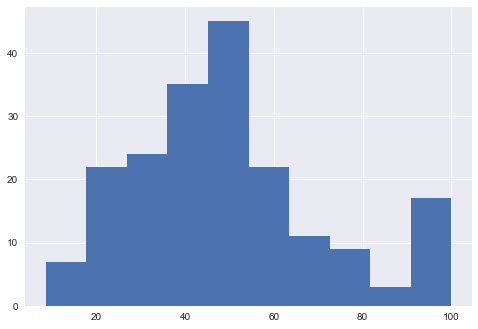

In [198]:
df_new=breed_outcome[breed_outcome['outcometype']=='Adoption']
df_new
plt.hist(df_new['percentage'],10)
plt.show()

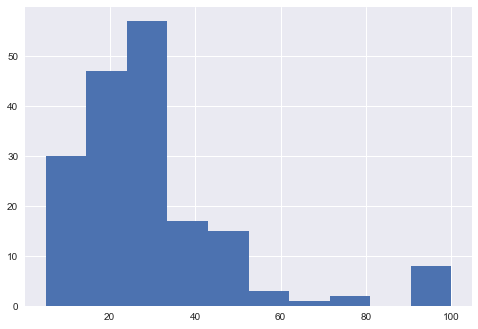

In [199]:
df_new=breed_outcome[breed_outcome['outcometype']=='Transfer']
df_new
plt.hist(df_new['percentage'],10)
plt.show()

In [200]:
df_new=breed_outcome.loc[:,['breed','outcometype','percentage']]
df_new['outcometype'].unique()

array(['Adoption', 'Return_to_owner', 'Transfer', 'Euthanasia', 'Died'],
      dtype=object)

In [201]:
df_new=breed_outcome.loc[:,['breed','outcometype','percentage']]

df_new['percentage1']=np.where(df_new['outcometype']=='Adoption',df_new['percentage'],0)
df_new['percentage2']=np.where(df_new['outcometype']=='Return_to_owner',df_new['percentage'],0)
df_new['percentage3']=np.where(df_new['outcometype']=='Transfer',df_new['percentage'],0)
df_new['percentage4']=np.where(df_new['outcometype']=='Euthanasia',df_new['percentage'],0)
df_new


,breed,outcometype,percentage,percentage1,percentage2,percentage3,percentage4
0,Abyssinian,Adoption,100.000000,100.000000,0.000000,0.000000,0.000000
1,Affenpinscher,Adoption,66.666667,66.666667,0.000000,0.000000,0.000000
2,Affenpinscher,Return_to_owner,33.333333,0.000000,33.333333,0.000000,0.000000
3,Afghan Hound,Return_to_owner,100.000000,0.000000,100.000000,0.000000,0.000000
4,Airedale Terrier,Adoption,25.000000,25.000000,0.000000,0.000000,0.000000
5,Airedale Terrier,Return_to_owner,25.000000,0.000000,25.000000,0.000000,0.000000
6,Airedale Terrier,Transfer,50.000000,0.000000,0.000000,50.000000,0.000000
7,Akita,Adoption,47.619048,47.619048,0.000000,0.000000,0.000000
8,Akita,Euthanasia,9.523810,0.000000,0.000000,0.000000,9.523810
9,Akita,Return_to_owner,28.571429,0.000000,28.571429,0.000000,0.000000


In [202]:
df=df_new.loc[:,['breed','percentage1','percentage2','percentage3','percentage4']]
df=df.groupby('breed', as_index=False).agg({'percentage1':'sum','percentage2':'sum','percentage3':'sum','percentage4':'sum'})
df

,breed,percentage1,percentage2,percentage3,percentage4
0,Abyssinian,100.000000,0.000000,0.000000,0.000000
1,Affenpinscher,66.666667,33.333333,0.000000,0.000000
2,Afghan Hound,0.000000,100.000000,0.000000,0.000000
3,Airedale Terrier,25.000000,25.000000,50.000000,0.000000
4,Akita,47.619048,28.571429,14.285714,9.523810
5,Alaskan Husky,43.750000,43.750000,12.500000,0.000000
6,Alaskan Malamute,36.363636,54.545455,9.090909,0.000000
7,American Bulldog,34.615385,32.307692,23.076923,10.000000
8,American Eskimo,42.857143,28.571429,14.285714,14.285714
9,American Foxhound,40.000000,60.000000,0.000000,0.000000


In [203]:
X=df.iloc[:,1:5]
X

,percentage1,percentage2,percentage3,percentage4
0,100.000000,0.000000,0.000000,0.000000
1,66.666667,33.333333,0.000000,0.000000
2,0.000000,100.000000,0.000000,0.000000
3,25.000000,25.000000,50.000000,0.000000
4,47.619048,28.571429,14.285714,9.523810
5,43.750000,43.750000,12.500000,0.000000
6,36.363636,54.545455,9.090909,0.000000
7,34.615385,32.307692,23.076923,10.000000
8,42.857143,28.571429,14.285714,14.285714
9,40.000000,60.000000,0.000000,0.000000


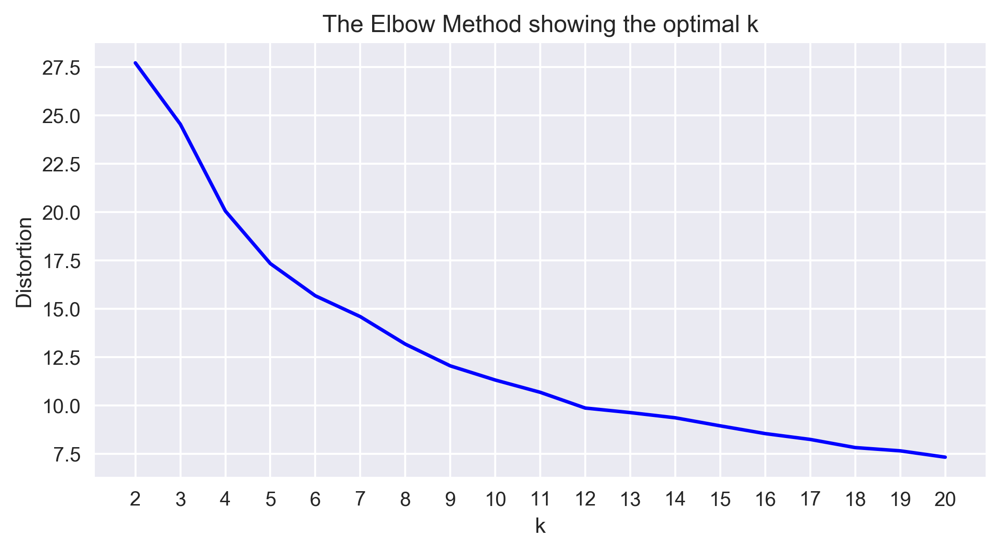

In [204]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from matplotlib.pyplot import figure

distortions = []
K = range(2,21)
for k in K:
    kmeanModel = KMeans(n_clusters = k, n_init = 1000).fit(X)
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

figure(num=None, figsize=(8, 4), dpi=300, facecolor='w', edgecolor='k')
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.xticks(range(2,21))
plt.show()


In [205]:
from sklearn.cluster import KMeans

# Number of clusters
kmeans = KMeans(n_clusters=11, n_init=1000).fit(X)
# Fitting the input data
kmeans = kmeans.fit(X)
# Getting the cluster labels
labels = kmeans.predict(X)
# Centroid values
centroids = kmeans.cluster_centers_

In [206]:
labels

array([ 6,  8,  4,  5,  0,  1,  1,  5,  0,  1,  5,  2,  0,  0,  0,  0,  0,
        0,  1,  3,  0,  1,  0, 10,  5,  8,  5,  6,  7,  0,  1,  1,  0,  0,
        4,  0,  3,  0,  1,  0,  0, 10,  0,  0,  0,  1,  3,  5, 10,  1,  1,
        6,  0,  3,  1,  0,  0,  0,  1,  0,  0,  0,  5,  0,  5,  5,  0,  0,
        4,  9,  0,  0,  0,  0, 10,  5,  9,  5,  9,  9,  9,  0,  1,  6,  8,
        3,  8, 10,  8,  5,  2,  2,  8,  9,  8,  0,  5,  2,  0,  1,  1,  3,
        1,  5,  5,  3,  5,  0,  6,  0,  0,  6,  1,  2,  0,  5,  0,  0,  9,
       10,  6, 10,  0,  2,  0,  3,  0, 10,  6,  3,  0,  0,  9,  0,  6,  0,
        0,  0,  2, 10,  9,  8,  6,  2,  0,  5,  6,  8, 10,  4,  8,  1,  3,
        3,  5,  8,  3,  0,  5,  5,  6,  9,  8,  0,  5,  6,  8,  5,  3,  9,
        0,  3,  1,  1,  5,  9,  7,  8,  0,  5,  6,  5,  1, 10,  9,  1,  1,
        5,  3,  9,  0,  2,  1,  4,  5,  7,  0,  1,  1,  6,  4,  1,  0,  7,
        0,  1,  2,  6,  5,  6,  4,  8, 10,  7,  8,  5,  0,  0,  4,  0])

In [207]:
centroids=pd.DataFrame(centroids)
centroids

,0,1,2,3
0,49.223763,23.291218,2.361493e+01,3.534017e+00
1,34.727791,49.215460,1.287517e+01,2.946512e+00
2,2.500000,1.111111,9.527778e+01,1.111111e+00
3,72.572539,4.328476,1.974902e+01,3.349963e+00
4,1.562500,96.875000,1.562500e+00,4.440892e-16
5,27.695311,34.112077,3.322697e+01,4.862458e+00
6,100.000000,0.000000,-3.552714e-15,8.881784e-16
7,25.000000,18.333333,2.000000e+01,3.666667e+01
8,66.280442,28.257371,3.587188e+00,1.666667e+00
9,45.314363,4.764668,4.394756e+01,5.311007e+00


In [208]:
labels= pd.DataFrame(labels)
labels

,0
0,6
1,8
2,4
3,5
4,0
5,1
6,1
7,5
8,0
9,1


In [209]:
df['breed_label']=labels
df

,breed,percentage1,percentage2,percentage3,percentage4,breed_label
0,Abyssinian,100.000000,0.000000,0.000000,0.000000,6
1,Affenpinscher,66.666667,33.333333,0.000000,0.000000,8
2,Afghan Hound,0.000000,100.000000,0.000000,0.000000,4
3,Airedale Terrier,25.000000,25.000000,50.000000,0.000000,5
4,Akita,47.619048,28.571429,14.285714,9.523810,0
5,Alaskan Husky,43.750000,43.750000,12.500000,0.000000,1
6,Alaskan Malamute,36.363636,54.545455,9.090909,0.000000,1
7,American Bulldog,34.615385,32.307692,23.076923,10.000000,5
8,American Eskimo,42.857143,28.571429,14.285714,14.285714,0
9,American Foxhound,40.000000,60.000000,0.000000,0.000000,1


In [210]:
breeds_final

,index,0,1,outcome,cross_breed
0,0,Shetland Sheepdog,None,Return_to_owner,0
1,1,Domestic Shorthair,None,Euthanasia,0
2,2,Pit Bull,None,Adoption,0
3,3,Domestic Shorthair,None,Transfer,0
4,4,Lhasa Apso,Miniature Poodle,Transfer,1
5,5,Cairn Terrier,Chihuahua Shorthair,Transfer,1
6,6,Domestic Shorthair,None,Transfer,0
7,7,Domestic Shorthair,None,Transfer,0
8,8,American Pit Bull Terrier,None,Adoption,0
9,9,Cairn Terrier,None,Adoption,0


In [211]:
df=df.loc[:,['breed','breed_label']]
df.columns=['Breed','Breed_label']
df

,Breed,Breed_label
0,Abyssinian,6
1,Affenpinscher,8
2,Afghan Hound,4
3,Airedale Terrier,5
4,Akita,0
5,Alaskan Husky,1
6,Alaskan Malamute,1
7,American Bulldog,5
8,American Eskimo,0
9,American Foxhound,1


In [212]:
train1['Breed_initial']=breeds_final[0]
train1

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed,Breed_initial
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog
1,A656520,Emily,2013-10-13 12:44:00,Euthanasia,Suffering,0,2,1 year,Domestic Shorthair Mix,Cream Tabby,2013,10,13,12,44,2.0,1,365,year,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,Domestic Shorthair
2,A686464,Pearce,2015-01-31 12:28:00,Adoption,Foster,1,3,2 years,Pit Bull Mix,Blue/White,2015,1,31,12,28,1.0,1,730,years,1.0,6.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Pit Bull
3,A683430,NaN,2014-07-11 19:09:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Cream,2014,7,11,19,9,1.0,0,21,weeks,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Domestic Shorthair
4,A667013,NaN,2013-11-15 12:52:00,Transfer,Partner,1,3,2 years,Lhasa Apso/Miniature Poodle,Tan,2013,11,15,12,52,1.0,1,730,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,Lhasa Apso
5,A677334,Elsa,2014-04-25 13:04:00,Transfer,Partner,1,1,1 month,Cairn Terrier/Chihuahua Shorthair,Black/Tan,2014,4,25,13,4,2.0,0,30,month,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,Cairn Terrier
6,A699218,Jimmy,2015-03-28 13:11:00,Transfer,Partner,0,4,3 weeks,Domestic Shorthair Mix,Blue Tabby,2015,3,28,13,11,1.0,0,21,weeks,1.0,5.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,Domestic Shorthair
7,A701489,NaN,2015-04-30 17:02:00,Transfer,Partner,0,5,3 weeks,Domestic Shorthair Mix,Brown Tabby,2015,4,30,17,2,3.0,0,21,weeks,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,Domestic Shorthair
8,A671784,Lucy,2014-02-04 17:17:00,Adoption,NaN,1,2,5 months,American Pit Bull Terrier Mix,Red/White,2014,2,4,17,17,2.0,1,150,months,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,American Pit Bull Terrier
9,A677747,NaN,2014-05-03 07:48:00,Adoption,Offsite,1,2,1 year,Cairn Terrier,White,2014,5,3,7,48,2.0,1,365,year,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Cairn Terrier


In [213]:
train1=pd.merge(train1, df, right_on='Breed', left_on='Breed_initial', how='right')
train1

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed_x,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed,Breed_initial,Breed_y,Breed_label
0,A671945,Hambone,2014-02-12 18:22:00,Return_to_owner,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
1,A694714,Remy,2015-03-16 17:05:00,Adoption,Foster,1,3,3 years,Shetland Sheepdog/Border Collie,Black/White,2015,3,16,17,5,1.0,1,1095,years,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Shetland Sheepdog,Shetland Sheepdog,5
2,A382251,Princess,2014-11-08 19:01:00,Return_to_owner,NaN,1,2,10 years,Shetland Sheepdog Mix,Brown/White,2014,11,8,19,1,2.0,1,3650,years,1.0,8.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
3,A706228,Rico,2015-06-27 15:16:00,Transfer,Partner,1,4,2 years,Shetland Sheepdog,Tricolor,2015,6,27,15,16,1.0,0,730,years,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,Shetland Sheepdog,Shetland Sheepdog,5
4,A702929,Sparky,2015-05-28 17:30:00,Adoption,NaN,1,2,5 months,Shetland Sheepdog Mix,White/Tan,2015,5,28,17,30,2.0,1,150,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
5,A681897,Aspen,2014-10-12 13:58:00,Transfer,Partner,1,4,2 years,Shetland Sheepdog Mix,Sable/White,2014,10,12,13,58,1.0,0,730,years,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
6,A706957,NaN,2015-07-07 10:07:00,Euthanasia,Suffering,1,1,9 years,Shetland Sheepdog Mix,Brown,2015,7,7,10,7,2.0,0,3285,years,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
7,A178569,Boti,2014-03-23 15:57:00,Return_to_owner,NaN,1,3,15 years,Shetland Sheepdog Mix,White/Black,2014,3,23,15,57,1.0,1,5475,years,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
8,A609918,Billy,2015-06-29 18:29:00,Return_to_owner,NaN,1,3,13 years,Shetland Sheepdog/Pomeranian,Gold,2015,6,29,18,29,1.0,1,4745,years,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Shetland Sheepdog,Shetland Sheepdog,5
9,A669375,NaN,2013-12-20 11:22:00,Transfer,Partner,1,3,3 years,Shetland Sheepdog,Sable/White,2013,12,20,11,22,1.0,1,1095,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Shetland Sheepdog,Shetland Sheepdog,5


In [214]:
breed_test=test1['Breed'].str.split("/", expand=True)
breed_test

,0,1,2
0,Labrador Retriever Mix,None,None
1,German Shepherd,Siberian Husky,None
2,Domestic Shorthair Mix,None,None
3,Collie Smooth Mix,None,None
4,Miniature Poodle Mix,None,None
5,Beagle Mix,None,None
6,Domestic Medium Hair Mix,None,None
7,Domestic Shorthair Mix,None,None
8,Cairn Terrier,None,None
9,Pit Bull Mix,None,None


In [215]:
breed_test[breed_test[2].notnull()]


,0,1,2
4889,German Shepherd,Black,Tan Hound
8168,Black,Tan Hound,Siberian Husky
10555,German Shepherd,Black,Tan Hound
10697,Labrador Retriever,Black,Tan Hound


In [216]:
breed_test[1].replace(to_replace='Tan Hound', value='Black Tan Hound', inplace=True)
breed_test[1].replace(to_replace='Black', value='Black Tan Hound', inplace=True)
breed_test[0].replace(to_replace='Tan Hound', value='Black Tan Hound', inplace=True)
breed_test[0].replace(to_replace='Black', value='Black Tan Hound', inplace=True)

In [217]:
breed_test.loc[8168,1]='Siberian Husky'

In [218]:
del breed_test[2]
breed_test

,0,1
0,Labrador Retriever Mix,None
1,German Shepherd,Siberian Husky
2,Domestic Shorthair Mix,None
3,Collie Smooth Mix,None
4,Miniature Poodle Mix,None
5,Beagle Mix,None
6,Domestic Medium Hair Mix,None
7,Domestic Shorthair Mix,None
8,Cairn Terrier,None
9,Pit Bull Mix,None


In [219]:
breed_test[breed_test[1].notnull()]

,0,1
1,German Shepherd,Siberian Husky
14,Flat Coat Retriever,German Shepherd
15,Pointer,Labrador Retriever
24,Black Mouth Cur,Boxer
31,Chihuahua Shorthair,Dachshund
38,Miniature Poodle,Lhasa Apso
45,Whippet,Rat Terrier
49,Labrador Retriever,Doberman Pinsch
51,Black Tan Hound,Tan Hound Mix
59,Plott Hound,Labrador Retriever


In [220]:
breed_test['cross_breed']= np.where(breed_test[1].isnull(),0,1)
breed_test

,0,1,cross_breed
0,Labrador Retriever Mix,None,0
1,German Shepherd,Siberian Husky,1
2,Domestic Shorthair Mix,None,0
3,Collie Smooth Mix,None,0
4,Miniature Poodle Mix,None,0
5,Beagle Mix,None,0
6,Domestic Medium Hair Mix,None,0
7,Domestic Shorthair Mix,None,0
8,Cairn Terrier,None,0
9,Pit Bull Mix,None,0


In [221]:
test1['cross_breed']= breed_test['cross_breed']

In [222]:
breed_test_mix=test1['Breed'].str.split(" Mix", expand=True)
breed_test_mix['mix']=np.where(breed_test_mix[1].isnull(),0,1)
breed_test_mix

,0,1,mix
0,Labrador Retriever,,1
1,German Shepherd/Siberian Husky,None,0
2,Domestic Shorthair,,1
3,Collie Smooth,,1
4,Miniature Poodle,,1
5,Beagle,,1
6,Domestic Medium Hair,,1
7,Domestic Shorthair,,1
8,Cairn Terrier,None,0
9,Pit Bull,,1


In [223]:
test1['mix']=breed_test_mix['mix']
test1

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
5,6,Beau,2015-06-23 11:17:00,1,3,3 years,Beagle Mix,Brown/White,2015,6,23,11,17,1.0,1,1095,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
6,7,Bobo,2014-03-12 09:45:00,0,3,13 years,Domestic Medium Hair Mix,Brown Tabby/White,2014,3,12,9,45,1.0,1,4745,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1
7,8,Abby,2014-06-25 08:27:00,0,2,6 months,Domestic Shorthair Mix,Brown Tabby,2014,6,25,8,27,2.0,1,180,months,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
8,9,Ruby Grace,2014-11-12 18:05:00,1,2,3 months,Cairn Terrier,Black/Cream,2014,11,12,18,5,2.0,1,90,months,1.0,10.0,2.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,10,Ruby,2014-04-07 17:41:00,1,2,1 year,Pit Bull Mix,Brown/White,2014,4,7,17,41,2.0,1,365,year,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1


In [224]:
breed_test_final=breed_test_mix[0].str.split("/", expand=True)
breed_test_final

,0,1,2
0,Labrador Retriever,None,None
1,German Shepherd,Siberian Husky,None
2,Domestic Shorthair,None,None
3,Collie Smooth,None,None
4,Miniature Poodle,None,None
5,Beagle,None,None
6,Domestic Medium Hair,None,None
7,Domestic Shorthair,None,None
8,Cairn Terrier,None,None
9,Pit Bull,None,None


In [225]:
test1['Breed_initial']=breed_test_final[0]
test1

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix,Breed_initial
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Labrador Retriever
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,German Shepherd
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Collie Smooth
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Miniature Poodle
5,6,Beau,2015-06-23 11:17:00,1,3,3 years,Beagle Mix,Brown/White,2015,6,23,11,17,1.0,1,1095,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Beagle
6,7,Bobo,2014-03-12 09:45:00,0,3,13 years,Domestic Medium Hair Mix,Brown Tabby/White,2014,3,12,9,45,1.0,1,4745,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,Domestic Medium Hair
7,8,Abby,2014-06-25 08:27:00,0,2,6 months,Domestic Shorthair Mix,Brown Tabby,2014,6,25,8,27,2.0,1,180,months,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair
8,9,Ruby Grace,2014-11-12 18:05:00,1,2,3 months,Cairn Terrier,Black/Cream,2014,11,12,18,5,2.0,1,90,months,1.0,10.0,2.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Cairn Terrier
9,10,Ruby,2014-04-07 17:41:00,1,2,1 year,Pit Bull Mix,Brown/White,2014,4,7,17,41,2.0,1,365,year,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Pit Bull


In [226]:
test1['Breed_initial'].replace(to_replace='Black', value='Black Tan Hound', inplace=True)
test1['Breed_initial'].replace(to_replace='Tan Hound', value='Black Tan Hound', inplace=True)

In [227]:
a=pd.merge(test1, df, right_on='Breed', left_on='Breed_initial', how='left')


In [228]:
a[a['Breed_label'].isnull()]

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed_x,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix,Breed_initial,Breed_y,Breed_label
674,675,Millie,2015-10-14 16:42:00,0,2,8 years,Scottish Fold Mix,Brown Tabby/White,2015,10,14,16,42,2.0,1,2920,years,1.0,6.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,Scottish Fold,NaN,NaN
1184,1185,NaN,2015-04-18 12:44:00,0,2,2 months,American Wirehair Mix,Blue,2015,4,18,12,44,2.0,1,60,months,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,American Wirehair,NaN,NaN
1639,1640,Milo,2014-09-06 16:24:00,0,3,5 years,Munchkin Shorthair Mix,Brown Tabby,2014,9,6,16,24,1.0,1,1825,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Munchkin Shorthair,NaN,NaN
1671,1672,Prancer,2015-12-22 18:05:00,1,2,4 years,Coton De Tulear Mix,White,2015,12,22,18,5,2.0,1,1460,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Coton De Tulear,NaN,NaN
3922,3923,Dasher,2015-12-22 18:26:00,1,3,4 years,Coton De Tulear Mix,White,2015,12,22,18,26,1.0,1,1460,years,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Coton De Tulear,NaN,NaN
4456,4457,Baxter,2015-05-02 19:10:00,1,3,11 years,Dachshund Stan Mix,Black/Tan,2015,5,2,19,10,1.0,1,4015,years,1.0,6.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,Dachshund Stan,NaN,NaN
5470,5471,Hal,2014-09-19 15:59:00,1,3,3 years,Dandie Dinmont,Tan,2014,9,19,15,59,1.0,1,1095,years,1.0,3.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Dandie Dinmont,NaN,NaN
5555,5556,Gibson,2015-06-11 13:18:00,0,3,4 years,Oriental Sh Mix,White/Brown Tabby,2015,6,11,13,18,1.0,1,1460,years,1.0,6.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,Oriental Sh,NaN,NaN
5874,5875,Liza,2015-09-01 15:53:00,0,2,4 years,Chartreux Mix,Blue,2015,9,1,15,53,2.0,1,1460,years,1.0,4.0,1.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Chartreux,NaN,NaN
6035,6036,Zoe,2014-01-02 12:51:00,1,2,15 years,Coton De Tulear,White,2014,1,2,12,51,2.0,1,5475,years,1.0,3.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Coton De Tulear,NaN,NaN


In [229]:
a['Breed_label'].astype('object').describe()

count     11442.0
unique       11.0
top           9.0
freq       4789.0
Name: Breed_label, dtype: float64

In [233]:
a['Breed_label']= np.where(a['Breed_label'].isnull(),9,a['Breed_label'])
a

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed_x,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix,Breed_initial,Breed_y,Breed_label
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Labrador Retriever,Labrador Retriever,0.0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,German Shepherd,German Shepherd,0.0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair,Domestic Shorthair,9.0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Collie Smooth,Collie Smooth,0.0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Miniature Poodle,Miniature Poodle,0.0
5,6,Beau,2015-06-23 11:17:00,1,3,3 years,Beagle Mix,Brown/White,2015,6,23,11,17,1.0,1,1095,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Beagle,Beagle,0.0
6,7,Bobo,2014-03-12 09:45:00,0,3,13 years,Domestic Medium Hair Mix,Brown Tabby/White,2014,3,12,9,45,1.0,1,4745,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,Domestic Medium Hair,Domestic Medium Hair,9.0
7,8,Abby,2014-06-25 08:27:00,0,2,6 months,Domestic Shorthair Mix,Brown Tabby,2014,6,25,8,27,2.0,1,180,months,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair,Domestic Shorthair,9.0
8,9,Ruby Grace,2014-11-12 18:05:00,1,2,3 months,Cairn Terrier,Black/Cream,2014,11,12,18,5,2.0,1,90,months,1.0,10.0,2.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Cairn Terrier,Cairn Terrier,0.0
9,10,Ruby,2014-04-07 17:41:00,1,2,1 year,Pit Bull Mix,Brown/White,2014,4,7,17,41,2.0,1,365,year,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Pit Bull,Pit Bull,5.0


In [234]:
a.isnull().sum()

ID                   0
Name              3225
DateTime             0
AnimalType           0
SexuponOutcome       0
AgeuponOutcome       0
Breed_x              0
Color                0
year                 0
month                0
day                  0
houroftheday         0
minutes              0
Sex                  0
neutered             0
Age                  0
Time                 0
name_present         0
lengthofname         0
words_in_name        0
Agouti               0
Apricot              0
Black                0
Blue                 0
Brindle              0
Brown                0
Buff                 0
Calico               0
Chocolate            0
Cream                0
Fawn                 0
Flame                0
Gold                 0
Gray                 0
Lilac                0
Liver                0
Lynx                 0
Merle                0
Orange               0
Pink                 0
Point                0
Red                  0
Ruddy                0
Sable      

In [235]:
test1=a
test1

,ID,Name,DateTime,AnimalType,SexuponOutcome,AgeuponOutcome,Breed_x,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix,Breed_initial,Breed_y,Breed_label
0,1,Summer,2015-10-12 12:15:00,1,1,10 months,Labrador Retriever Mix,Red/White,2015,10,12,12,15,2.0,0,300,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Labrador Retriever,Labrador Retriever,0.0
1,2,Cheyenne,2014-07-26 17:59:00,1,2,2 years,German Shepherd/Siberian Husky,Black/Tan,2014,7,26,17,59,2.0,1,730,years,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,German Shepherd,German Shepherd,0.0
2,3,Gus,2016-01-13 12:20:00,0,3,1 year,Domestic Shorthair Mix,Brown Tabby,2016,1,13,12,20,1.0,1,365,year,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair,Domestic Shorthair,9.0
3,4,Pongo,2013-12-28 18:12:00,1,4,4 months,Collie Smooth Mix,Tricolor,2013,12,28,18,12,1.0,0,120,months,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,Collie Smooth,Collie Smooth,0.0
4,5,Skooter,2015-09-24 17:59:00,1,3,2 years,Miniature Poodle Mix,White,2015,9,24,17,59,1.0,1,730,years,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Miniature Poodle,Miniature Poodle,0.0
5,6,Beau,2015-06-23 11:17:00,1,3,3 years,Beagle Mix,Brown/White,2015,6,23,11,17,1.0,1,1095,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Beagle,Beagle,0.0
6,7,Bobo,2014-03-12 09:45:00,0,3,13 years,Domestic Medium Hair Mix,Brown Tabby/White,2014,3,12,9,45,1.0,1,4745,years,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,Domestic Medium Hair,Domestic Medium Hair,9.0
7,8,Abby,2014-06-25 08:27:00,0,2,6 months,Domestic Shorthair Mix,Brown Tabby,2014,6,25,8,27,2.0,1,180,months,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,Domestic Shorthair,Domestic Shorthair,9.0
8,9,Ruby Grace,2014-11-12 18:05:00,1,2,3 months,Cairn Terrier,Black/Cream,2014,11,12,18,5,2.0,1,90,months,1.0,10.0,2.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Cairn Terrier,Cairn Terrier,0.0
9,10,Ruby,2014-04-07 17:41:00,1,2,1 year,Pit Bull Mix,Brown/White,2014,4,7,17,41,2.0,1,365,year,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Pit Bull,Pit Bull,5.0


In [236]:
train_data= train1.copy()

In [237]:
train_data['OutcomeType']=np.where(train_data['OutcomeType']=='Return_to_owner',1,train_data['OutcomeType'])
train_data['OutcomeType']=np.where(train_data['OutcomeType']=='Adoption',2,train_data['OutcomeType'])
train_data['OutcomeType']=np.where(train_data['OutcomeType']=='Euthanasia',3,train_data['OutcomeType'])
train_data['OutcomeType']=np.where(train_data['OutcomeType']=='Transfer',4,train_data['OutcomeType'])
train_data['OutcomeType']=np.where(train_data['OutcomeType']=='Died',5,train_data['OutcomeType'])

train_data

,AnimalID,Name,DateTime,OutcomeType,OutcomeSubtype,AnimalType,SexuponOutcome,AgeuponOutcome,Breed_x,Color,year,month,day,houroftheday,minutes,Sex,neutered,Age,Time,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed,Breed_initial,Breed_y,Breed_label
0,A671945,Hambone,2014-02-12 18:22:00,1,NaN,1,3,1 year,Shetland Sheepdog Mix,Brown/White,2014,2,12,18,22,1.0,1,365,year,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
1,A694714,Remy,2015-03-16 17:05:00,2,Foster,1,3,3 years,Shetland Sheepdog/Border Collie,Black/White,2015,3,16,17,5,1.0,1,1095,years,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,Shetland Sheepdog,Shetland Sheepdog,5
2,A382251,Princess,2014-11-08 19:01:00,1,NaN,1,2,10 years,Shetland Sheepdog Mix,Brown/White,2014,11,8,19,1,2.0,1,3650,years,1.0,8.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
3,A706228,Rico,2015-06-27 15:16:00,4,Partner,1,4,2 years,Shetland Sheepdog,Tricolor,2015,6,27,15,16,1.0,0,730,years,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,Shetland Sheepdog,Shetland Sheepdog,5
4,A702929,Sparky,2015-05-28 17:30:00,2,NaN,1,2,5 months,Shetland Sheepdog Mix,White/Tan,2015,5,28,17,30,2.0,1,150,months,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
5,A681897,Aspen,2014-10-12 13:58:00,4,Partner,1,4,2 years,Shetland Sheepdog Mix,Sable/White,2014,10,12,13,58,1.0,0,730,years,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
6,A706957,NaN,2015-07-07 10:07:00,3,Suffering,1,1,9 years,Shetland Sheepdog Mix,Brown,2015,7,7,10,7,2.0,0,3285,years,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
7,A178569,Boti,2014-03-23 15:57:00,1,NaN,1,3,15 years,Shetland Sheepdog Mix,White/Black,2014,3,23,15,57,1.0,1,5475,years,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,Shetland Sheepdog,Shetland Sheepdog,5
8,A609918,Billy,2015-06-29 18:29:00,1,NaN,1,3,13 years,Shetland Sheepdog/Pomeranian,Gold,2015,6,29,18,29,1.0,1,4745,years,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,Shetland Sheepdog,Shetland Sheepdog,5
9,A669375,NaN,2013-12-20 11:22:00,4,Partner,1,3,3 years,Shetland Sheepdog,Sable/White,2013,12,20,11,22,1.0,1,1095,years,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,Shetland Sheepdog,Shetland Sheepdog,5


In [238]:
train_data.groupby('OutcomeType')['AnimalID'].count()

OutcomeType
1     4786
2    10769
3     1555
4     9422
5      197
Name: AnimalID, dtype: int64

In [239]:
 #train_data=train_data[train_data['OutcomeType']!=5]

In [240]:
train_data.columns

Index(['AnimalID', 'Name', 'DateTime', 'OutcomeType', 'OutcomeSubtype',
       'AnimalType', 'SexuponOutcome', 'AgeuponOutcome', 'Breed_x', 'Color',
       'year', 'month', 'day', 'houroftheday', 'minutes', 'Sex', 'neutered',
       'Age', 'Time', 'name_present', 'lengthofname', 'words_in_name',
       'Agouti', 'Apricot', 'Black', 'Blue', 'Brindle', 'Brown', 'Buff',
       'Calico', 'Chocolate', 'Cream', 'Fawn', 'Flame', 'Gold', 'Gray',
       'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange', 'Pink', 'Point', 'Red',
       'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke', 'Tabby', 'Tan', 'Tick',
       'Tiger', 'Torbie', 'Tortie', 'Tricolor', 'White', 'Yellow', 'mix',
       'cross_breed', 'Breed_initial', 'Breed_y', 'Breed_label'],
      dtype='object')

In [241]:
train_data1=train_data.loc[:,[ 'OutcomeType',
       'AnimalType', 'SexuponOutcome',
       'year', 'month', 'day', 'houroftheday', 'minutes', 'Sex', 'neutered',
       'Age', 'name_present', 'lengthofname', 'words_in_name',
       'Agouti', 'Apricot', 'Black', 'Blue', 'Brindle', 'Brown', 'Buff',
       'Calico', 'Chocolate', 'Cream', 'Fawn', 'Flame', 'Gold', 'Gray',
       'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange', 'Pink', 'Point', 'Red',
       'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke', 'Tabby', 'Tan', 'Tick',
       'Tiger', 'Torbie', 'Tortie', 'Tricolor', 'White', 'Yellow', 'mix',
       'cross_breed','Breed_label']]


In [242]:
train_data1['Age']=train_data1['Age'].astype('float')/365

In [243]:
train_data1

,OutcomeType,AnimalType,SexuponOutcome,year,month,day,houroftheday,minutes,Sex,neutered,Age,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed,Breed_label
0,1,1,3,2014,2,12,18,22,1.0,1,1.000000,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
1,2,1,3,2015,3,16,17,5,1.0,1,3.000000,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,5
2,1,1,2,2014,11,8,19,1,2.0,1,10.000000,1.0,8.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
3,4,1,4,2015,6,27,15,16,1.0,0,2.000000,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5
4,2,1,2,2015,5,28,17,30,2.0,1,0.410959,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,5
5,4,1,4,2014,10,12,13,58,1.0,0,2.000000,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
6,3,1,1,2015,7,7,10,7,2.0,0,9.000000,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5
7,1,1,3,2014,3,23,15,57,1.0,1,15.000000,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
8,1,1,3,2015,6,29,18,29,1.0,1,13.000000,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5
9,4,1,3,2013,12,20,11,22,1.0,1,3.000000,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5


In [244]:
train_data1.columns

Index(['OutcomeType', 'AnimalType', 'SexuponOutcome', 'year', 'month', 'day',
       'houroftheday', 'minutes', 'Sex', 'neutered', 'Age', 'name_present',
       'lengthofname', 'words_in_name', 'Agouti', 'Apricot', 'Black', 'Blue',
       'Brindle', 'Brown', 'Buff', 'Calico', 'Chocolate', 'Cream', 'Fawn',
       'Flame', 'Gold', 'Gray', 'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange',
       'Pink', 'Point', 'Red', 'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke',
       'Tabby', 'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie', 'Tricolor',
       'White', 'Yellow', 'mix', 'cross_breed', 'Breed_label'],
      dtype='object')

In [245]:
categorical_variables=['OutcomeType', 'AnimalType', 'SexuponOutcome', 'year', 'month', 'day',
       'houroftheday', 'minutes', 'Sex', 'neutered','name_present',
       'words_in_name', 'Agouti', 'Apricot', 'Black', 'Blue',
       'Brindle', 'Brown', 'Buff', 'Calico', 'Chocolate', 'Cream', 'Fawn',
       'Flame', 'Gold', 'Gray', 'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange',
       'Pink', 'Point', 'Red', 'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke',
       'Tabby', 'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie', 'Tricolor',
       'White', 'Yellow', 'mix', 'cross_breed', 'Breed_label']

for i in categorical_variables:
    train_data1[i]= train_data1[i].astype('category')
    
train_data1.dtypes

OutcomeType       category
AnimalType        category
SexuponOutcome    category
year              category
month             category
day               category
houroftheday      category
minutes           category
Sex               category
neutered          category
Age                float64
name_present      category
lengthofname       float64
words_in_name     category
Agouti            category
Apricot           category
Black             category
Blue              category
Brindle           category
Brown             category
Buff              category
Calico            category
Chocolate         category
Cream             category
Fawn              category
Flame             category
Gold              category
Gray              category
Lilac             category
Liver             category
Lynx              category
Merle             category
Orange            category
Pink              category
Point             category
Red               category
Ruddy             category
S

In [246]:
x=train_data1.iloc[:,1:]
x

,AnimalType,SexuponOutcome,year,month,day,houroftheday,minutes,Sex,neutered,Age,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,mix,cross_breed,Breed_label
0,1,3,2014,2,12,18,22,1.0,1,1.000000,1.0,7.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
1,1,3,2015,3,16,17,5,1.0,1,3.000000,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,5
2,1,2,2014,11,8,19,1,2.0,1,10.000000,1.0,8.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
3,1,4,2015,6,27,15,16,1.0,0,2.000000,1.0,4.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5
4,1,2,2015,5,28,17,30,2.0,1,0.410959,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,5
5,1,4,2014,10,12,13,58,1.0,0,2.000000,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
6,1,1,2015,7,7,10,7,2.0,0,9.000000,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,5
7,1,3,2014,3,23,15,57,1.0,1,15.000000,1.0,4.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,5
8,1,3,2015,6,29,18,29,1.0,1,13.000000,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5
9,1,3,2013,12,20,11,22,1.0,1,3.000000,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5


In [247]:
y=pd.DataFrame(train_data1.iloc[:,0])
y

,OutcomeType
0,1
1,2
2,1
3,4
4,2
5,4
6,3
7,1
8,1
9,4


In [248]:
from sklearn.cross_validation import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, random_state=30)

C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [249]:
from sklearn.ensemble import RandomForestClassifier
classifier= RandomForestClassifier(n_estimators=1300, oob_score=True,n_jobs=-1, criterion='entropy',max_features=17, random_state=30)

classifier.fit(x_train,y_train)
classifier.score(x_test, y_test)
classifier.oob_score_

C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d
C:\Users\Transorg\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


0.6870122928915019

In [250]:
from sklearn.metrics import confusion_matrix
y_pred=classifier.predict(x_test)
confusion_matrix(y_test,y_pred)

array([[ 662,  607,    8,  163,    0],
       [ 339, 2713,    5,  214,    1],
       [  87,   63,  101,  176,    1],
       [ 244,  510,   39, 2020,    0],
       [   2,    9,    7,   45,    3]], dtype=int64)

In [251]:
y_test.describe()

,OutcomeType
count,8019
unique,5
top,2
freq,3272


In [756]:
train_data2=train_data.loc[:,[ 'OutcomeType',
       'AnimalType', 'SexuponOutcome',
       'year', 'month', 'day', 'houroftheday', 'minutes', 'Sex', 'neutered',
       'Age', 'name_present', 'lengthofname', 'words_in_name',
       'Agouti', 'Apricot', 'Black', 'Blue', 'Brindle', 'Brown', 'Buff',
       'Calico', 'Chocolate', 'Cream', 'Fawn', 'Flame', 'Gold', 'Gray',
       'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange', 'Pink', 'Point', 'Red',
       'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke', 'Tabby', 'Tan', 'Tick',
       'Tiger', 'Torbie', 'Tortie', 'Tricolor', 'White', 'Yellow', 'mix',
       'cross_breed','Breed_label']]

In [757]:
x1=train_data2.iloc[:,1:]
x1.dtypes

AnimalType          int64
SexuponOutcome      int64
year                int64
month               int64
day                 int64
houroftheday        int64
minutes             int64
Sex               float64
neutered            int32
Age                 int64
name_present      float64
lengthofname      float64
words_in_name     float64
Agouti              int32
Apricot             int32
Black               int32
Blue                int32
Brindle             int32
Brown               int32
Buff                int32
Calico              int32
Chocolate           int32
Cream               int32
Fawn                int32
Flame               int32
Gold                int32
Gray                int32
Lilac               int32
Liver               int32
Lynx                int32
Merle               int32
Orange              int32
Pink                int32
Point               int32
Red                 int32
Ruddy               int32
Sable               int32
Seal                int32
Silver      

In [760]:
y1=pd.DataFrame(train_data2.iloc[:,0])
y1=y1.astype('int64')
y1.dtypes

OutcomeType    int64
dtype: object

In [761]:
from sklearn.cross_validation import train_test_split
x1_train, x1_test, y1_train, y1_test = train_test_split(x1,y1, test_size=0.3, random_state=30)

In [777]:
from xgboost import XGBClassifier
XGBclassifier = XGBClassifier(n_estimators=500, learning_rate=0.1, depth=5, objective = "multi:softmax", n_jobs=-1,random_state=0) # obj="reg:linear";“multi:softmax"for multiclass classification
XGBclassifier.fit(x1_train, y1_train)
XGBclassifier.score(x1_test, y1_test)


C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:95: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:128: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


0.6937185929648241

In [778]:
from sklearn.metrics import confusion_matrix
y1_pred=XGBclassifier.predict(x1_test)
confusion_matrix(y1_test,y1_pred)

C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


array([[ 675,  559,    8,  164],
       [ 288, 2755,   10,  224],
       [  90,   62,  119,  220],
       [ 230,  544,   39, 1973]], dtype=int64)

In [780]:
XGMul = pd.DataFrame(XGBclassifier.predict_proba(x1_test))
XGMul

,0,1,2,3
0,0.009768,0.841149,0.016430,0.132652
1,0.235599,0.505947,0.010336,0.248118
2,0.000467,0.000096,0.006797,0.992640
3,0.311988,0.059695,0.049455,0.578862
4,0.155697,0.446663,0.022694,0.374945
5,0.303464,0.083590,0.013282,0.599664
6,0.157599,0.672586,0.016784,0.153031
7,0.001993,0.880171,0.003639,0.114197
8,0.017879,0.920335,0.003368,0.058419
9,0.354801,0.515212,0.013482,0.116504


In [784]:
RF= pd.DataFrame(classifier.predict_proba(x_test))
RF

,0,1,2,3
0,0.026154,0.693846,0.002308,0.277692
1,0.243846,0.550769,0.033846,0.171538
2,0.002308,0.000000,0.087692,0.910000
3,0.383077,0.030769,0.149231,0.436923
4,0.167692,0.433077,0.019231,0.380000
5,0.322308,0.030000,0.014615,0.633077
6,0.091538,0.780769,0.017692,0.110000
7,0.008462,0.952308,0.003077,0.036154
8,0.024615,0.958462,0.000000,0.016923
9,0.408462,0.534615,0.003077,0.053846


In [788]:
final_probability=(RF+ XGMul)/2
final_probability.columns=[1,2,3,4]
final_probability

,1,2,3,4
0,0.017961,0.767498,0.009369,0.205172
1,0.239723,0.528358,0.022091,0.209828
2,0.001387,0.000048,0.047244,0.951320
3,0.347533,0.045232,0.099343,0.507893
4,0.161695,0.439870,0.020962,0.377473
5,0.312886,0.056795,0.013949,0.616371
6,0.124569,0.726678,0.017238,0.131515
7,0.005227,0.916239,0.003358,0.075175
8,0.021247,0.939398,0.001684,0.037671
9,0.381631,0.524914,0.008280,0.085175


In [789]:
y_pred_final=pd.DataFrame(final_probability).apply(lambda x:x.argmax(), axis=1)
y_pred_final



C:\Users\Transorg\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: 'argmax' is deprecated, use 'idxmax' instead. The behavior of 'argmax'
will be corrected to return the positional maximum in the future.
Use 'series.values.argmax' to get the position of the maximum now.
  """Entry point for launching an IPython kernel.


0       2
1       2
2       4
3       4
4       2
5       4
6       2
7       2
8       2
9       2
10      2
11      4
12      2
13      2
14      2
15      2
16      4
17      1
18      4
19      2
20      1
21      4
22      2
23      2
24      2
25      2
26      2
27      4
28      4
29      2
30      1
31      4
32      1
33      2
34      4
35      2
36      1
37      2
38      2
39      1
40      2
41      2
42      2
43      2
44      4
45      4
46      2
47      4
48      2
49      4
50      4
51      2
52      4
53      4
54      2
55      2
56      4
57      2
58      1
59      2
60      4
61      2
62      1
63      3
64      2
65      4
66      2
67      2
68      2
69      4
70      2
71      4
72      2
73      2
74      3
75      4
76      4
77      2
78      2
79      2
80      2
81      2
82      2
83      4
84      4
85      4
86      2
87      2
88      4
89      2
90      1
91      2
92      2
93      2
94      2
95      2
96      4
97      2
98      2
99      4


In [791]:
confusion_matrix(y_test,y_pred_final)

array([[ 652,  574,    5,  175],
       [ 298, 2770,    5,  204],
       [  93,   66,  116,  216],
       [ 224,  518,   31, 2013]], dtype=int64)

In [792]:
test1.columns

Index(['ID', 'Name', 'DateTime', 'AnimalType', 'SexuponOutcome',
       'AgeuponOutcome', 'Breed_x', 'Color', 'year', 'month', 'day',
       'houroftheday', 'minutes', 'Sex', 'neutered', 'Age', 'Time',
       'name_present', 'lengthofname', 'words_in_name', 'Agouti', 'Apricot',
       'Black', 'Blue', 'Brindle', 'Brown', 'Buff', 'Calico', 'Chocolate',
       'Cream', 'Fawn', 'Flame', 'Gold', 'Gray', 'Lilac', 'Liver', 'Lynx',
       'Merle', 'Orange', 'Pink', 'Point', 'Red', 'Ruddy', 'Sable', 'Seal',
       'Silver', 'Smoke', 'Tabby', 'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie',
       'Tricolor', 'White', 'Yellow', 'cross_breed', 'mix', 'Breed_initial',
       'Breed_y', 'Breed_label'],
      dtype='object')

In [794]:
test_data=test1.loc[:,['AnimalType', 'SexuponOutcome',
       'year', 'month', 'day',
       'houroftheday', 'minutes', 'Sex', 'neutered', 'Age',
       'name_present', 'lengthofname', 'words_in_name', 'Agouti', 'Apricot',
       'Black', 'Blue', 'Brindle', 'Brown', 'Buff', 'Calico', 'Chocolate',
       'Cream', 'Fawn', 'Flame', 'Gold', 'Gray', 'Lilac', 'Liver', 'Lynx',
       'Merle', 'Orange', 'Pink', 'Point', 'Red', 'Ruddy', 'Sable', 'Seal',
       'Silver', 'Smoke', 'Tabby', 'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie',
       'Tricolor', 'White', 'Yellow', 'cross_breed', 'mix',
       'Breed_label']]


In [796]:
test_data['Age']=test_data['Age'].astype('float')/365
test_data

,AnimalType,SexuponOutcome,year,month,day,houroftheday,minutes,Sex,neutered,Age,name_present,lengthofname,words_in_name,Agouti,Apricot,Black,Blue,Brindle,Brown,Buff,Calico,Chocolate,Cream,Fawn,Flame,Gold,Gray,Lilac,Liver,Lynx,Merle,Orange,Pink,Point,Red,Ruddy,Sable,Seal,Silver,Smoke,Tabby,Tan,Tick,Tiger,Torbie,Tortie,Tricolor,White,Yellow,cross_breed,mix,Breed_label
0,1,1,2015,10,12,12,15,2.0,0,0.821918,1.0,6.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1.0
1,1,2,2014,7,26,17,59,2.0,1,2.000000,1.0,8.0,1.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1.0
2,0,3,2016,1,13,12,20,1.0,1,1.000000,1.0,3.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,10.0
3,1,4,2013,12,28,18,12,1.0,0,0.328767,1.0,5.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1.0
4,1,3,2015,9,24,17,59,1.0,1,2.000000,1.0,7.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1.0
5,1,3,2015,6,23,11,17,1.0,1,3.000000,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1.0
6,0,3,2014,3,12,9,45,1.0,1,13.000000,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,10.0
7,0,2,2014,6,25,8,27,2.0,1,0.493151,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,10.0
8,1,2,2014,11,12,18,5,2.0,1,0.246575,1.0,10.0,2.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0
9,1,2,2014,4,7,17,41,2.0,1,1.000000,1.0,4.0,1.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,8.0


In [798]:
categorical_variables_test=['AnimalType', 'SexuponOutcome', 'year', 'month', 'day',
       'houroftheday', 'minutes', 'Sex', 'neutered','name_present',
       'words_in_name', 'Agouti', 'Apricot', 'Black', 'Blue',
       'Brindle', 'Brown', 'Buff', 'Calico', 'Chocolate', 'Cream', 'Fawn',
       'Flame', 'Gold', 'Gray', 'Lilac', 'Liver', 'Lynx', 'Merle', 'Orange',
       'Pink', 'Point', 'Red', 'Ruddy', 'Sable', 'Seal', 'Silver', 'Smoke',
       'Tabby', 'Tan', 'Tick', 'Tiger', 'Torbie', 'Tortie', 'Tricolor',
       'White', 'Yellow', 'mix', 'cross_breed', 'Breed_label']

for i in categorical_variables_test:
    test_data[i]= test_data[i].astype('category')
    
test_data.dtypes

AnimalType        category
SexuponOutcome    category
year              category
month             category
day               category
houroftheday      category
minutes           category
Sex               category
neutered          category
Age                float64
name_present      category
lengthofname       float64
words_in_name     category
Agouti            category
Apricot           category
Black             category
Blue              category
Brindle           category
Brown             category
Buff              category
Calico            category
Chocolate         category
Cream             category
Fawn              category
Flame             category
Gold              category
Gray              category
Lilac             category
Liver             category
Lynx              category
Merle             category
Orange            category
Pink              category
Point             category
Red               category
Ruddy             category
Sable             category
S

In [825]:
classifier.fit(x,y)
classifier.oob_score_

C:\Users\Transorg\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


0.6921695536683004

In [826]:
y_pred=pd.DataFrame(classifier.predict(test_data))
y_pred

,0
0,4
1,2
2,2
3,4
4,2
5,1
6,3
7,2
8,2
9,2


In [827]:
y_pred=pd.get_dummies(y_pred[0])
y_pred

,1,2,3,4,5
0,0,0,0,1,0
1,0,1,0,0,0
2,0,1,0,0,0
3,0,0,0,1,0
4,0,1,0,0,0
5,1,0,0,0,0
6,0,0,1,0,0
7,0,1,0,0,0
8,0,1,0,0,0
9,0,1,0,0,0


In [828]:
y_pred.columns=['Return_to_owner','Adoption','Euthanasia','Transfer','Died']
y_pred

,Return_to_owner,Adoption,Euthanasia,Transfer,Died
0,0,0,0,1,0
1,0,1,0,0,0
2,0,1,0,0,0
3,0,0,0,1,0
4,0,1,0,0,0
5,1,0,0,0,0
6,0,0,1,0,0
7,0,1,0,0,0
8,0,1,0,0,0
9,0,1,0,0,0


In [829]:
y_pred['ID']=test1['ID']
y_pred

,Return_to_owner,Adoption,Euthanasia,Transfer,Died,ID
0,0,0,0,1,0,1
1,0,1,0,0,0,2
2,0,1,0,0,0,3
3,0,0,0,1,0,4
4,0,1,0,0,0,5
5,1,0,0,0,0,6
6,0,0,1,0,0,7
7,0,1,0,0,0,8
8,0,1,0,0,0,9
9,0,1,0,0,0,10


In [830]:
y_pred.to_csv('D:/test_file.csv', index = False)

In [831]:
RF= pd.DataFrame(classifier.predict_proba(test_data))
RF


,0,1,2,3,4
0,0.170769,0.090769,0.033077,0.705385,0.000000
1,0.287692,0.594615,0.013846,0.103846,0.000000
2,0.240000,0.466923,0.031538,0.260769,0.000769
3,0.257692,0.073077,0.056923,0.612308,0.000000
4,0.317692,0.536154,0.005385,0.140769,0.000000
5,0.690000,0.205385,0.028462,0.076154,0.000000
6,0.213077,0.303846,0.306923,0.154615,0.021538
7,0.033077,0.722308,0.020000,0.222308,0.002308
8,0.121538,0.795385,0.000769,0.081538,0.000769
9,0.385385,0.510769,0.048462,0.050769,0.004615


In [832]:
RF.columns=['Return_to_owner','Adoption','Euthanasia','Transfer','Died']
RF

,Return_to_owner,Adoption,Euthanasia,Transfer,Died
0,0.170769,0.090769,0.033077,0.705385,0.000000
1,0.287692,0.594615,0.013846,0.103846,0.000000
2,0.240000,0.466923,0.031538,0.260769,0.000769
3,0.257692,0.073077,0.056923,0.612308,0.000000
4,0.317692,0.536154,0.005385,0.140769,0.000000
5,0.690000,0.205385,0.028462,0.076154,0.000000
6,0.213077,0.303846,0.306923,0.154615,0.021538
7,0.033077,0.722308,0.020000,0.222308,0.002308
8,0.121538,0.795385,0.000769,0.081538,0.000769
9,0.385385,0.510769,0.048462,0.050769,0.004615


In [833]:
RF['ID']=test1['ID']
RF

,Return_to_owner,Adoption,Euthanasia,Transfer,Died,ID
0,0.170769,0.090769,0.033077,0.705385,0.000000,1
1,0.287692,0.594615,0.013846,0.103846,0.000000,2
2,0.240000,0.466923,0.031538,0.260769,0.000769,3
3,0.257692,0.073077,0.056923,0.612308,0.000000,4
4,0.317692,0.536154,0.005385,0.140769,0.000000,5
5,0.690000,0.205385,0.028462,0.076154,0.000000,6
6,0.213077,0.303846,0.306923,0.154615,0.021538,7
7,0.033077,0.722308,0.020000,0.222308,0.002308,8
8,0.121538,0.795385,0.000769,0.081538,0.000769,9
9,0.385385,0.510769,0.048462,0.050769,0.004615,10


In [834]:
RF.to_csv('D:/test_file_prob.csv', index = False)

In [835]:
XGBclassifier.fit(x1,y1)

C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:95: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Transorg\AppData\Roaming\Python\Python36\site-packages\sklearn\preprocessing\label.py:128: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, depth=5, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=500, n_jobs=-1, nthread=None,
       objective='multi:softprob', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=1)

In [836]:
test_data=test_data.astype('int64')


In [837]:
XG=pd.DataFrame(classifier.predict_proba(test_data))
XG

,0,1,2,3,4
0,0.041538,0.078462,0.015385,0.850000,0.014615
1,0.287692,0.594615,0.013846,0.103846,0.000000
2,0.240000,0.466923,0.031538,0.260769,0.000769
3,0.133077,0.133846,0.036154,0.677692,0.019231
4,0.317692,0.536154,0.005385,0.140769,0.000000
5,0.690000,0.205385,0.028462,0.076154,0.000000
6,0.213077,0.303846,0.306923,0.154615,0.021538
7,0.001538,0.870000,0.006154,0.090000,0.032308
8,0.058462,0.830000,0.003077,0.106923,0.001538
9,0.385385,0.510769,0.048462,0.050769,0.004615


In [838]:
XG.columns=['Return_to_owner','Adoption','Euthanasia','Transfer','Died']
XG['ID']=test1['ID']
final=(RF+XG)/2
final

,Return_to_owner,Adoption,Euthanasia,Transfer,Died,ID
0,0.106154,0.084615,0.024231,0.777692,0.007308,1
1,0.287692,0.594615,0.013846,0.103846,0.000000,2
2,0.240000,0.466923,0.031538,0.260769,0.000769,3
3,0.195385,0.103462,0.046538,0.645000,0.009615,4
4,0.317692,0.536154,0.005385,0.140769,0.000000,5
5,0.690000,0.205385,0.028462,0.076154,0.000000,6
6,0.213077,0.303846,0.306923,0.154615,0.021538,7
7,0.017308,0.796154,0.013077,0.156154,0.017308,8
8,0.090000,0.812692,0.001923,0.094231,0.001154,9
9,0.385385,0.510769,0.048462,0.050769,0.004615,10


In [839]:
final.to_csv('D:/test_file_prob_final.csv', index = False)

In [840]:
XG.to_csv('D:/test_file_prob_XG.csv', index = False)